In [4]:
import pandas as pd
import numpy as np
import missingno as msno
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold


import warnings; warnings.filterwarnings('ignore')


In [5]:
# используемые функции

# выделяем из датасета информацию(признаки) по 1 насосу
def sep_by_well(X_train, well_id):
    data_one_id = X_train.reset_index()
    data_one_id = data_one_id[data_one_id['WELL_ID'] == well_id]
    data_one_id = data_one_id.set_index('DT')
    data_one_id.drop(['WELL_ID'], axis=1, inplace=True)
    return data_one_id

# # выделяем из датасета информацию(целевой показатель) по 1 насосу
# def ysep_by_well(y_train, well_id):
#     y_train_one_id = y_train.reset_index()
#     y_train_one_id = y_train_one_id[y_train_one_id['WELL_ID']==well_id]
#     y_train_one_id = y_train_one_id.set_index('DT')
#     y_train_one_id.drop(['WELL_ID'], axis=1, inplace=True)
#     return y_train_one_id

# определяем интервалы 2-сигма и 3-сигма
def sigma_outline(y):
    y_train_one_id = y
    two_sigma = pd.Interval(left=float(y_train_one_id.mean() - 2 * y_train_one_id.std()), right=float(y_train_one_id.mean() + 2 * y_train_one_id.std()),closed='both')
    three_sigma = pd.Interval(left=float(y_train_one_id.mean() - 3 * y_train_one_id.std()), right=float(y_train_one_id.mean() + 3 * y_train_one_id.std()),closed='both')
    return two_sigma, three_sigma

# добавляем целевой признак аномалии  2-сигма и 3-сигма
def sigma_add(y):
    y_train_one_id = y
    two_sigma = pd.Interval(left=float(y_train_one_id.mean() - 2 * y_train_one_id.std()), right=float(y_train_one_id.mean() + 2 * y_train_one_id.std()),closed='both')
    three_sigma = pd.Interval(left=float(y_train_one_id.mean() - 3 * y_train_one_id.std()), right=float(y_train_one_id.mean() + 3 * y_train_one_id.std()),closed='both')
    y['2sigma'] = [ 0 if x in two_sigma else 1 for x in y['targ_press_h']]
    y['3sigma'] = [ 0 if x in three_sigma else 1 for x in y['targ_press_h']]
    return print(f""" 2sigma outlined: {len(y[y['2sigma'] == 1])} of {len(y)} 
 3sigma outlined: {len(y[y['3sigma'] == 1])} of {len(y)}""")


def model_validate_other_wells(pumps,data_prep,model):
    
    models_score = pd.DataFrame(columns={'model_name',
                             'accuracy_score',
                             'recall_score',
                             'f1_score',
                             'precision_score',
                             'roc_auc_score'})
    
    for pump in pumps:
        # выбираем данные для 1 насоса
        data_one_id = sep_by_well(data_prep, pump)

        # делим на признаки и целевые параметры 
        X_one_id = data_one_id.copy().drop(['targ_press_d','targ_press_h','targ_press_w'],axis=1)
        y_one_id = data_one_id['targ_press_h'].copy()
        print(X_one_id.shape, y_one_id.shape)
        y_one_id = pd.DataFrame(y_one_id, columns=['targ_press_h'])

        # выделяем аномалии по признаку попадания в интервал 2сигма,3сигма

        sigma_outline(y_one_id)
        sigma_add(y_one_id)

        y_one_id_2sigma = y_one_id['2sigma']

        model_predict = model.predict(X_one_id)

        pred = np.round(model_predict, 0)
        
        
        try:
            roc_auc_score_model = roc_auc_score(y_one_id_2sigma, pred)
        except:
            roc_auc_score_model = np.nan
        
        models_score = models_score.append({'model_name': model,
                                            'well_id': pump,                                            
                                 'accuracy_score': accuracy_score(y_one_id_2sigma, pred),
                                 'recall_score': recall_score(y_one_id_2sigma, pred),
                                 'f1_score': f1_score(y_one_id_2sigma, pred),
                                 'precision_score': precision_score(y_one_id_2sigma, pred),
                                 'roc_auc_score': roc_auc_score_model
                                           }, ignore_index=True)
    return models_score
    


In [6]:
data_prep.loc[226000188]

NameError: name 'data_prep' is not defined

In [7]:
data_raw = pd.read_csv('C:/Users/Peter/Documents/GitHub/project/cfp_dataset_v1.csv')

data_valid_raw = pd.read_csv('C:/Users/Peter/Documents/GitHub/project/cfp_dataset_v1_valid1.csv')

data_raw.drop(['Unnamed: 0','MIDUPT1138P2300058',
               'SHORTUPT1138P2300058', 'LONGUPT1138P2300058', 'T1013P500399'], axis=1, inplace=True)
data_valid_raw.drop(['Unnamed: 0','MIDUPT1138P2300058',
               'SHORTUPT1138P2300058', 'LONGUPT1138P2300058', 'T1013P500399'], axis=1, inplace=True)

data_raw.rename(columns={
    'T1138P6000096': "engine", 
 'T1138P6000315': "«engine_idle",
 'DMIDT1138P4000064': "workload_сh_d",
 'DSHORTT1138P4000064': "workload_сh_h",
 'DLONGT1138P4000064': "workload_сh_w",
 'DMIDT1138P2600012': "curr_сh_d",
 'DSHORTT1138P2600012': "curr_сh_h",
 'DLONGT1138P2600012': "curr_сh_w",
'DMIDT1205P2300000': "press_сh_d»",
 'DSHORTT1205P2300000': "press_сh_h»",
 'DLONGT1205P2300000': "press_сh_w",
'T1205P2300000': "press_coll",
 'T1138P4000064': "workload_eng",
 'T1138P2600012': "curr",
 'T1138P600050': "power_coef",
 'T1013P500399': "liq",
 'DMIDT1138P2300058': "targ_press_d",
 'DSHORTT1138P2300058': "targ_press_h",
 'DLONGT1138P2300058': "targ_press_w"
                  }, inplace=True)

data_raw.drop(['UUID','UNIXDT'], axis=1, inplace=True)

data_raw['DT'] = pd.to_datetime(data_raw['DT'])
data_valid_raw['DT'] = pd.to_datetime(data_valid_raw['DT'])


data_valid_raw.rename(columns={
    'T1138P6000096': "engine", 
 'T1138P6000315': "«engine_idle",
 'DMIDT1138P4000064': "workload_сh_d",
 'DSHORTT1138P4000064': "workload_сh_h",
 'DLONGT1138P4000064': "workload_сh_w",
 'DMIDT1138P2600012': "curr_сh_d",
 'DSHORTT1138P2600012': "curr_сh_h",
 'DLONGT1138P2600012': "curr_сh_w",
'DMIDT1205P2300000': "press_сh_d»",
 'DSHORTT1205P2300000': "press_сh_h»",
 'DLONGT1205P2300000': "press_сh_w",
'T1205P2300000': "press_coll",
 'T1138P4000064': "workload_eng",
 'T1138P2600012': "curr",
 'T1138P600050': "power_coef",
 'T1013P500399': "liq",
 'DMIDT1138P2300058': "targ_press_d",
 'DSHORTT1138P2300058': "targ_press_h",
 'DLONGT1138P2300058': "targ_press_w"
                  }, inplace=True)

data_valid_raw.drop(['UUID','UNIXDT'], axis=1, inplace=True)



#проверим пропуски
{key:data_raw[key].isna().sum() for key in data_raw.columns}




{'WELL_ID': 0,
 'DT': 0,
 'engine': 0,
 '«engine_idle': 0,
 'workload_сh_d': 0,
 'workload_сh_h': 0,
 'workload_сh_w': 0,
 'curr_сh_d': 0,
 'curr_сh_h': 0,
 'curr_сh_w': 0,
 'press_сh_d»': 0,
 'press_сh_h»': 0,
 'press_сh_w': 0,
 'press_coll': 1,
 'workload_eng': 0,
 'curr': 0,
 'power_coef': 0,
 'targ_press_d': 0,
 'targ_press_h': 0,
 'targ_press_w': 0}

'T1138P6000096': "Наработка двигателя с момента последнего включения, сек"  **engine**  
'T1138P6000315': "«Время простоя двигателя с момента последнего выключения, сек", **engine_idle**    
'DMIDT1138P4000064': "Средняя скорость изменения загрузки двигателя СУТ, %/час",  **workload_сh_d**  
'DSHORTT1138P4000064': "Средняя скорость изменения загрузки двигателя ЧАС, %/час",  **workload_сh_h**  
'DLONGT1138P4000064': "Средняя скорость изменения загрузки двигателя НЕДЕЛЯ, %/час",  **workload_сh_w**  
'DMIDT1138P2600012': "Средняя скорость изменения тока фазы A двигателя в СУТ, А/час",  **curr_сh_d**  
'DSHORTT1138P2600012': "Средняя скорость изменения тока фазы A двигателя в ЧАС, А/час",  **curr_сh_h**  
'DLONGT1138P2600012': "Средняя скорость изменения тока фазы A двигателя в НЕДЕЛЯ, А/час", **curr_сh_w**   
'DMIDT1205P2300000': "Средняя скорость изменения давления в коллекторе ИУ в СУТ, МПа/час»", **press_сh_d**   
'DSHORTT1205P2300000': "Средняя скорость изменения давления в коллекторе ИУ в ЧАС, МПа/час»",  **press_сh_h**  
'DLONGT1205P2300000': "Средняя скорость изменения давления в коллекторе ИУ в НЕДЕЛЯ, МПа/час»",  **press_сh_w**  
'T1205P2300000': "Давление в коллекторе измерительной установки, МПа",  **press_coll**  
'T1138P4000064': "Загрузка двигателя, %",  **workload_eng**  
'T1138P2600012': "Ток фазы A двигателя, А",  **curr**  
'T1138P600050': "Коэффициент мощности (cos fi)",  **power_coef**  
'T1013P500399': "Объём жидкости в рабочих условиях за время наработки суточный, м3",  **liq**  
'DMIDT1138P2300058': "Target - Средняя скорость изменения давления на приеме насоса в СУТ, МПа/час", **targ_press_d**   
'DSHORTT1138P2300058': "Target - Средняя скорость изменения давления на приеме насоса в ЧАС, МПа/час",  **targ_press_h**  
'DLONGT1138P2300058': "Target - Средняя скорость изменения давления на приеме насоса НЕДЕЛЯ, МПа/час"  **targ_press_w**  

<AxesSubplot:>

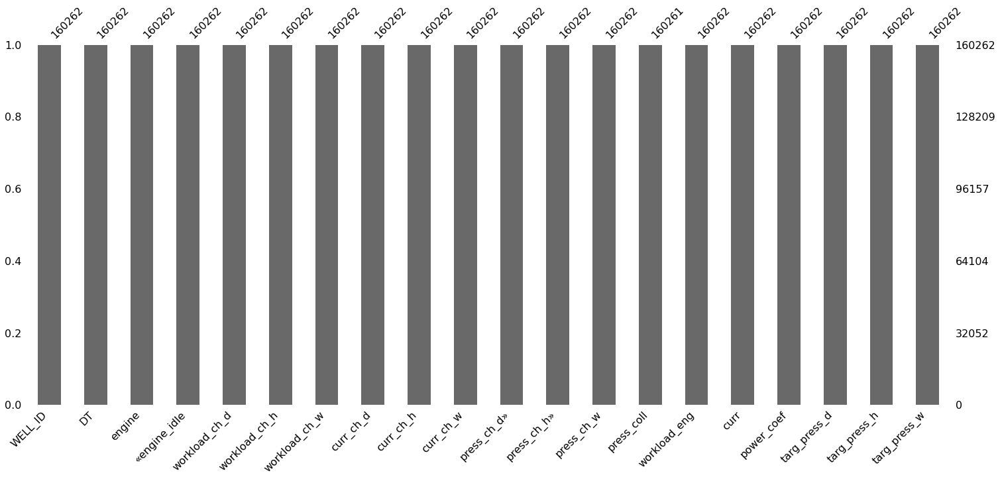

In [8]:
#выводим данные на график, чтобы визуально просмотреть наличие пропусков и сколько пропусков в данных
msno.bar(data_raw)

In [9]:
# увидели что пропущено только одно значение, заполним его средним
median_press = data_raw['press_coll'].median()
data_raw['press_coll'].fillna(median_press, inplace=True)

In [10]:
pumps = set(data_raw['WELL_ID'])
pumps

{226000188,
 226000198,
 226000297,
 226001846,
 226001947,
 226002142,
 226002148,
 226002307,
 226002416,
 226002603,
 226002627,
 226002861,
 226002998,
 226003074,
 226003080,
 226003316,
 226003330}

In [11]:
# дальше работаем с входными данными, преобразовывая их для удобства дальнейшей обработки

data_prep = data_raw.copy()
data_valid_prep = data_valid_raw.copy()

data_prep['hour'] = data_prep['DT'].dt.hour
data_prep['day_w'] = data_prep['DT'].dt.dayofweek
data_prep['minute'] = data_prep['DT'].dt.minute


data_valid_prep['hour'] = data_valid_prep['DT'].dt.hour
data_valid_prep['day_w'] = data_valid_prep['DT'].dt.dayofweek
data_valid_prep['minute'] = data_valid_prep['DT'].dt.minute


data_prep.set_index(['WELL_ID','DT'],inplace=True)
data_valid_prep.set_index(['WELL_ID','DT'],inplace=True)

data_prep = data_prep.sort_index()
data_valid_prep = data_valid_prep.sort_index()

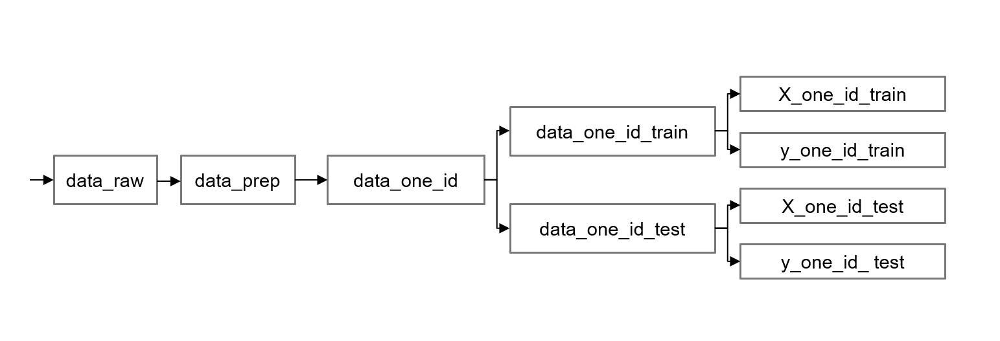

In [12]:
data_valid_prep

engine  «engine_idle  workload_сh_d  \
WELL_ID   DT                                                         
226000188 2019-06-20 08:00:00       0         17700      -3.137725   
          2019-06-20 08:05:00       0         18000      -3.137725   
          2019-06-20 08:10:00       0         18300      -3.137725   
          2019-06-20 08:15:00       0         18600      -3.137725   
          2019-06-20 08:20:00       0         18900      -3.137725   
...                               ...           ...            ...   
226003330 2019-06-26 02:30:00    8700             0      -1.959471   
          2019-06-26 02:35:00    9000             0      -2.059876   
          2019-06-26 02:40:00    9300             0      -2.039277   
          2019-06-26 02:45:00    9600             0      -2.018884   
          2019-06-26 02:50:00    9900             0      -1.998696   

                               workload_сh_h  workload_сh_w  curr_сh_d  \
WELL_ID   DT                                                             
226000188 2019-06-20 08:00:00       0.000000      -4.222888  -0.470845   
          2019-06-20 08:05:00       0.000000      -4.222888  -0.470845   
          2019-06-20 08:10:00       0.000000      -4.222888  -0.470845   
          2019-06-20 08:15:00       0.000000      -4.222888  -0.470845   
          2019-06-20 08:20:00       0.000000      -4.222888  -0.470845   
...                                      ...            ...        ...   
226003330 2019-06-26 02:30:00      -0.458841      -1.986861  -0.250939   
          2019-06-26 02:35:00      -1.612957      -1.996874  -0.248429   
          2019-06-26 02:40:00      -1.451661      -1.994877  -0.257945   
          2019-06-26 02:45:00      -1.306495      -1.992882  -0.231365   
          2019-06-26 02:50:00      -1.175845      -1.990889  -0.229052   

                               curr_сh_h  curr_сh_w  press_сh_d»  press_сh_h»  \
WELL_ID   DT                                                                    
226000188 2019-06-20 08:00:00   0.000000  -0.768889     0.000104     0.000000   
          2019-06-20 08:05:00   0.000000  -0.768889     0.000104     0.000000   
          2019-06-20 08:10:00   0.000000  -0.768889     0.000104     0.000000   
          2019-06-20 08:15:00   0.000000  -0.768889     0.000104     0.000000   
          2019-06-20 08:20:00   0.000000  -0.768889     0.000104     0.000000   
...                                  ...        ...          ...          ...   
226003330 2019-06-26 02:30:00  -0.210151  -0.252894    -0.000635    -0.010425   
          2019-06-26 02:35:00  -0.189136  -0.252641    -0.000629    -0.009382   
          2019-06-26 02:40:00  -0.290223  -0.253588    -0.000623    -0.008444   
          2019-06-26 02:45:00  -0.021200  -0.250935    -0.000616    -0.007600   
          2019-06-26 02:50:00  -0.019080  -0.250684    -0.000024    -0.000975   

                               ...  press_coll  workload_eng       curr  \
WELL_ID   DT                   ...                                        
226000188 2019-06-20 08:00:00  ...    1.582111             0   0.000000   
          2019-06-20 08:05:00  ...    1.580645             0   0.000000   
          2019-06-20 08:10:00  ...    1.572825             0   0.000000   
          2019-06-20 08:15:00  ...    1.566960             0   0.000000   
          2019-06-20 08:20:00  ...    1.567937             0   0.000000   
...                            ...         ...           ...        ...   
226003330 2019-06-26 02:30:00  ...    1.136364            60  17.900000   
          2019-06-26 02:35:00  ...    1.136364            59  17.900000   
          2019-06-26 02:40:00  ...    1.136364            59  17.799999   
          2019-06-26 02:45:00  ...    1.136364            59  18.000000   
          2019-06-26 02:50:00  ...    1.141251            59  18.000000   

                               power_coef  targ_press_d  targ_press_h  \
WELL_ID   DT                                          

In [13]:
# выбираем данные для 1 насоса

data_one_id = sep_by_well(data_prep, 226000188)
data_one_id_train, data_one_id_test = train_test_split(data_one_id, test_size = 0.33,shuffle=False)



# делим на признаки и целевые параметры 

X_one_id_train = data_one_id_train.drop(['targ_press_d','targ_press_h','targ_press_w'],axis=1)
y_one_id_train = data_one_id_train['targ_press_h']
y_one_id_train = pd.DataFrame(y_one_id_train, columns=['targ_press_h'])


X_one_id_test = data_one_id_test.drop(['targ_press_d','targ_press_h','targ_press_w'],axis=1)
y_one_id_test = data_one_id_test[['targ_press_h']]


# подготовка без разделения на насосы

X_all = data_prep.drop(['targ_press_d','targ_press_h','targ_press_w'],axis=1)
y_all = data_prep[['targ_press_h']]

X_all_valid = data_valid_prep.drop(['targ_press_d','targ_press_h','targ_press_w'],axis=1)
y_all_valid = data_valid_prep[['targ_press_h']]



In [14]:
# выделяем аномалии по признаку попадания в интервал 2сигма,3сигма

# sigma_outline(y_one_id_train)
sigma_add(y_one_id_train)

# sigma_outline(y_one_id_test)
sigma_add(y_one_id_test)




 2sigma outlined: 378 of 6683 
 3sigma outlined: 32 of 6683
 2sigma outlined: 193 of 3292 
 3sigma outlined: 13 of 3292


In [15]:
X_one_id_train

,engine,«engine_idle,workload_сh_d,workload_сh_h,workload_сh_w,curr_сh_d,curr_сh_h,curr_сh_w,press_сh_d»,press_сh_h»,press_сh_w,press_coll,workload_eng,curr,power_coef,hour,day_w,minute
DT,,,,,,,,,,,,,,,,,,
2019-06-27 06:40:00,0,13200,-3.232999,0.000000,-4.138484,-0.423734,0.000000,-0.656976,0.001927,0.000000,0.000129,1.648583,0,0.000000,0.000,6,3,40
2019-06-27 06:45:00,0,13500,-3.232999,0.000000,-4.138484,-0.423734,0.000000,-0.656976,0.001927,0.000000,0.000129,1.681818,0,0.000000,0.000,6,3,45
2019-06-27 06:50:00,0,13800,-3.232999,0.000000,-4.138484,-0.423734,0.000000,-0.656976,0.001927,0.000000,0.000129,1.650049,0,0.000000,0.000,6,3,50
2019-06-27 06:55:00,0,14100,-3.232999,0.000000,-4.138484,-0.423734,0.000000,-0.656976,0.001927,0.000000,0.000129,1.648583,0,0.000000,0.000,6,3,55
2019-06-27 07:00:00,0,14400,-3.232999,0.000000,-4.138484,-0.423734,0.000000,-0.656976,0.001927,0.000000,0.000129,1.642718,0,0.000000,0.000,7,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-20 12:35:00,6300,0,-5.185962,-7.692894,-4.349857,-0.667275,-0.908161,-0.582547,0.005858,-0.010510,0.003221,1.525904,45,17.799999,0.550,12,5,35
2019-07-20 12:40:00,6600,0,-5.134103,-6.923604,-4.345507,-0.660602,-0.817345,-0.581964,0.006973,0.002271,0.003336,1.535679,45,17.799999,0.555,12,5,40
2019-07-20 12:45:00,6900,0,-5.082762,-6.231244,-4.341161,-0.653996,-0.735610,-0.581382,0.005554,-0.011445,0.003197,1.524438,45,17.799999,0.552,12,5,45


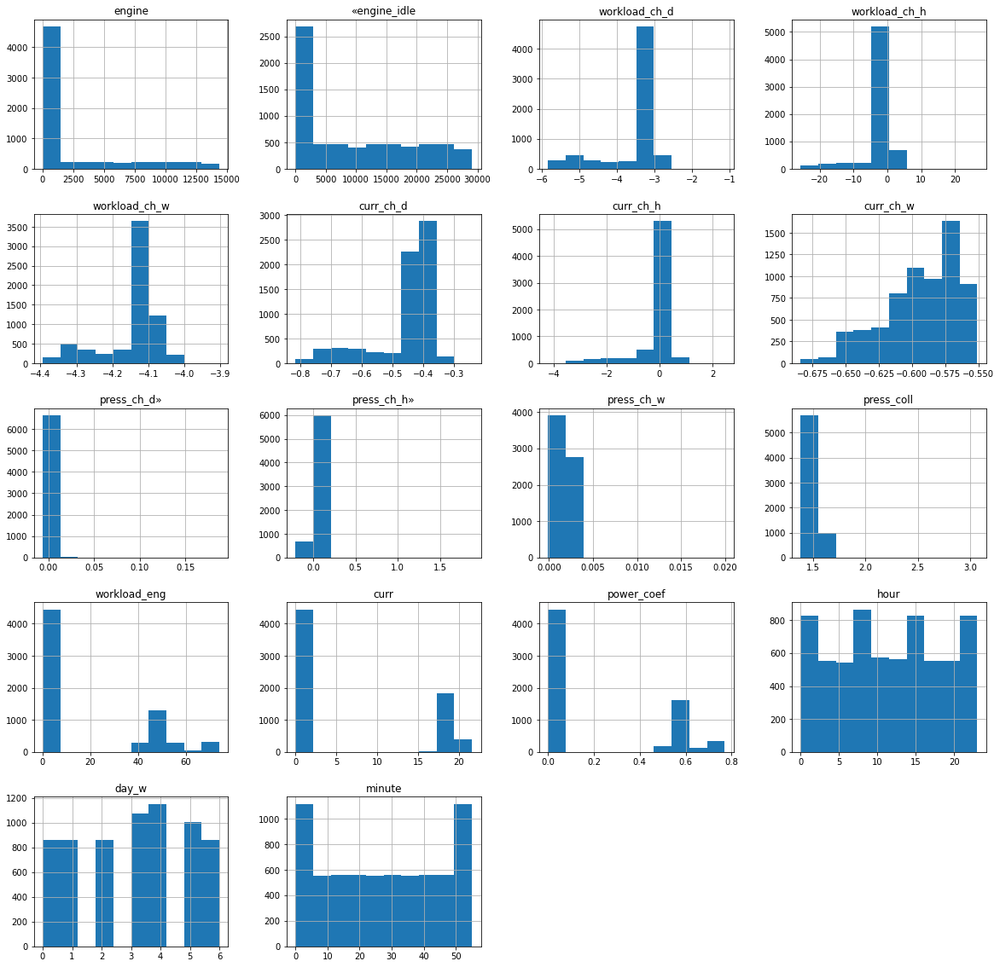

In [16]:
X_one_id_train.hist(figsize=(20, 20));


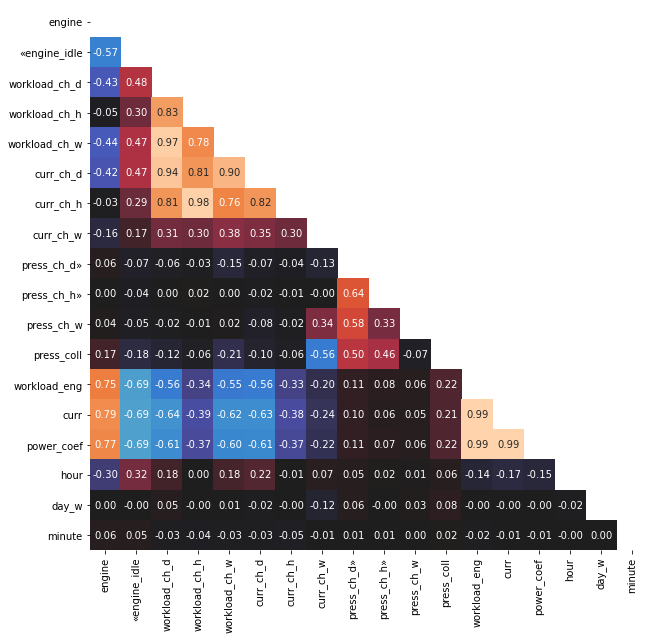

In [17]:
plt.figure(figsize=(10,10))

corr_matrix = X_one_id_train.corr()
lower = corr_matrix.where(np.tril(np.ones(corr_matrix.shape), k=-1).astype(np.bool))

sns.heatmap(lower, annot=True, fmt='.2f', cbar=False, center=0);

In [18]:
high_corr = [
    column for column in lower.columns if any((lower[column] > 0.6)|(lower[column] < -0.6))
]
high_corr

['engine',
 '«engine_idle',
 'workload_сh_d',
 'workload_сh_h',
 'workload_сh_w',
 'curr_сh_d',
 'press_сh_d»',
 'workload_eng',
 'curr']

In [19]:
other_features = [col for col in X_one_id_train.columns if col not in high_corr and col!='quality']


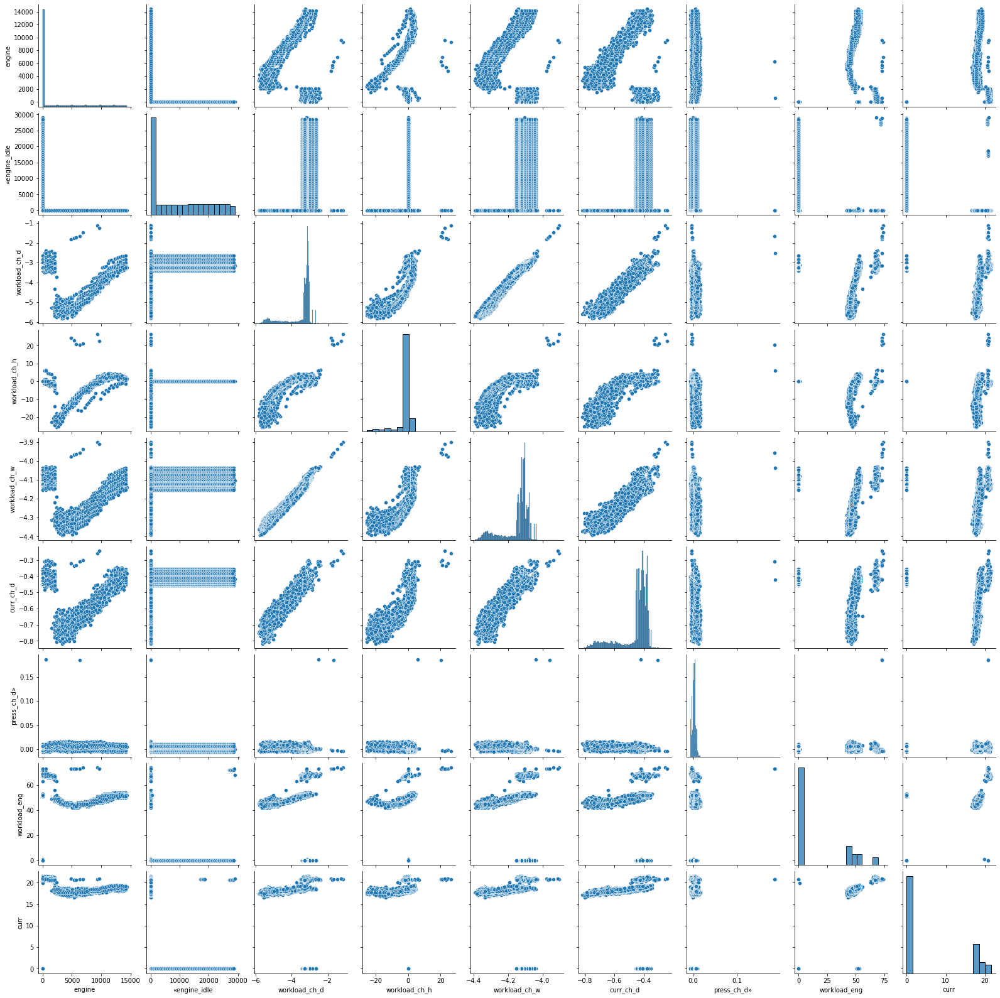

In [20]:
sns.pairplot(X_one_id_train[high_corr])


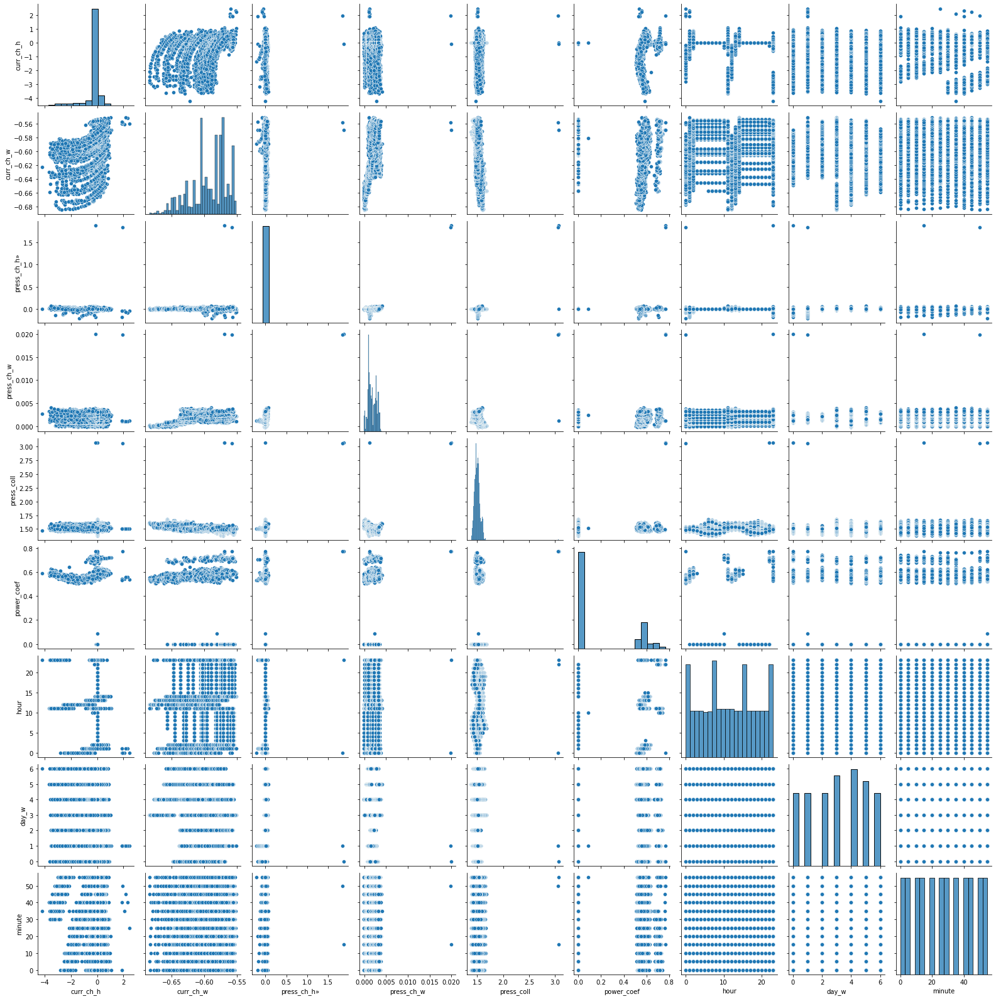

In [21]:
sns.pairplot(X_one_id_train[other_features])

***2. Простейшие методы***


**3-сигмы**


In [22]:
def outlier_std(data, col, threshold=3):
    mean = data[col].mean()
    std = data[col].std()
    up_bound = mean + threshold * std
    low_bound = mean - threshold * std
    anomalies = pd.concat([data[col]>up_bound, data[col]<low_bound], axis=1).any(1)
    return anomalies, up_bound, low_bound

In [23]:
def get_column_outliers(data, columns=None, function=outlier_std, threshold=3):
    if columns:
        columns_to_check = columns
    else:
        columns_to_check = data.columns
        
    outliers = pd.Series(data=[False]*len(data), index=data_features.index, name='is_outlier')
    comparison_table = {}
    for column in columns_to_check:
        anomalies, upper_bound, lower_bound = function(data, column, threshold=threshold)
        comparison_table[column] = [upper_bound, lower_bound, sum(anomalies), 100*sum(anomalies)/len(anomalies)]
        outliers[anomalies[anomalies].index] = True
    
    comparison_table = pd.DataFrame(comparison_table).T
    comparison_table.columns=['upper_bound', 'lower_bound', 'anomalies_count', 'anomalies_percentage']
    
    return comparison_table, outliers

def anomalies_report(outliers):
    print("Total number of outliers: {}\nPercentage of outliers:   {:.2f}%".format(
            sum(outliers), 100*sum(outliers)/len(outliers)))    

In [34]:
data_features = X_one_id_train.copy()


In [25]:
comparison_table, std_outliers = get_column_outliers(data_features)
anomalies_report(std_outliers)

Total number of outliers: 329
Percentage of outliers:   4.92%


In [26]:
comparison_table


,upper_bound,lower_bound,anomalies_count,anomalies_percentage
engine,14572.517917,-9901.172712,0.0,0.000000
«engine_idle,38310.962016,-19200.113595,0.0,0.000000
workload_сh_d,-1.273191,-5.711061,12.0,0.179560
workload_сh_h,13.642305,-16.639587,277.0,4.144845
workload_сh_w,-3.910880,-4.376484,12.0,0.179560
curr_сh_d,-0.149027,-0.766968,61.0,0.912764
curr_сh_h,1.859806,-2.258547,270.0,4.040102
curr_сh_w,-0.510386,-0.676721,15.0,0.224450
press_сh_d»,0.018081,-0.013458,2.0,0.029927
press_сh_h»,0.103270,-0.100525,16.0,0.239413


In [37]:
other_features

['curr_сh_h',
 'curr_сh_w',
 'press_сh_h»',
 'press_сh_w',
 'press_coll',
 'power_coef',
 'hour',
 'day_w',
 'minute']

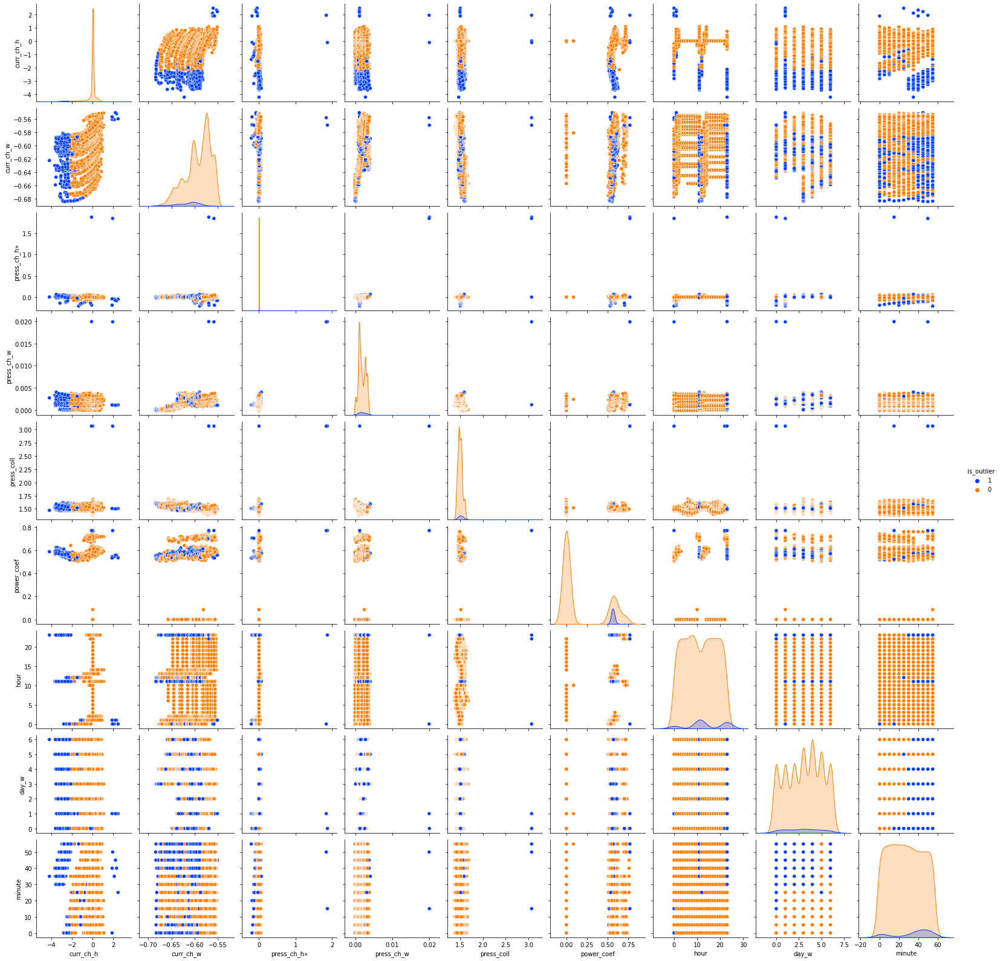

In [98]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = std_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
#              markers=['x', 'o'], 
             palette='bright');

***Межквартильное отклонение***

In [100]:
def outlier_iqr(data, col, threshold=3):
    IQR = data[col].quantile(0.75) - data[col].quantile(0.25)
    up_bound = data[col].quantile(0.75) + (IQR * threshold)
    low_bound = data[col].quantile(0.25) - (IQR * threshold)
    anomalies = pd.concat([data[col]>up_bound, data[col]<low_bound], axis=1).any(1)
    return anomalies, up_bound, low_bound

Включить метод, но указать что он не очень хорош (посмотреть строки с нулямя)

In [101]:
comparison_table, iqr_outliers = get_column_outliers(data_features, function=outlier_iqr)
anomalies_report(iqr_outliers)

Total number of outliers: 2184
Percentage of outliers:   32.68%


In [102]:
comparison_table

,upper_bound,lower_bound,anomalies_count,anomalies_percentage
engine,13200.000000,-9900.000000,135.0,2.020051
«engine_idle,72000.000000,-54000.000000,0.0,0.000000
workload_сh_d,-2.324815,-4.127716,1156.0,17.297621
workload_сh_h,0.000000,0.000000,2114.0,31.632500
workload_сh_w,-3.962242,-4.287312,720.0,10.773605
curr_сh_d,-0.215757,-0.633758,740.0,11.072871
curr_сh_h,0.000000,0.000000,2162.0,32.350741
curr_сh_w,-0.467289,-0.711909,0.0,0.000000
press_сh_d»,0.020935,-0.016503,2.0,0.029927
press_сh_h»,0.000000,0.000000,2180.0,32.620081


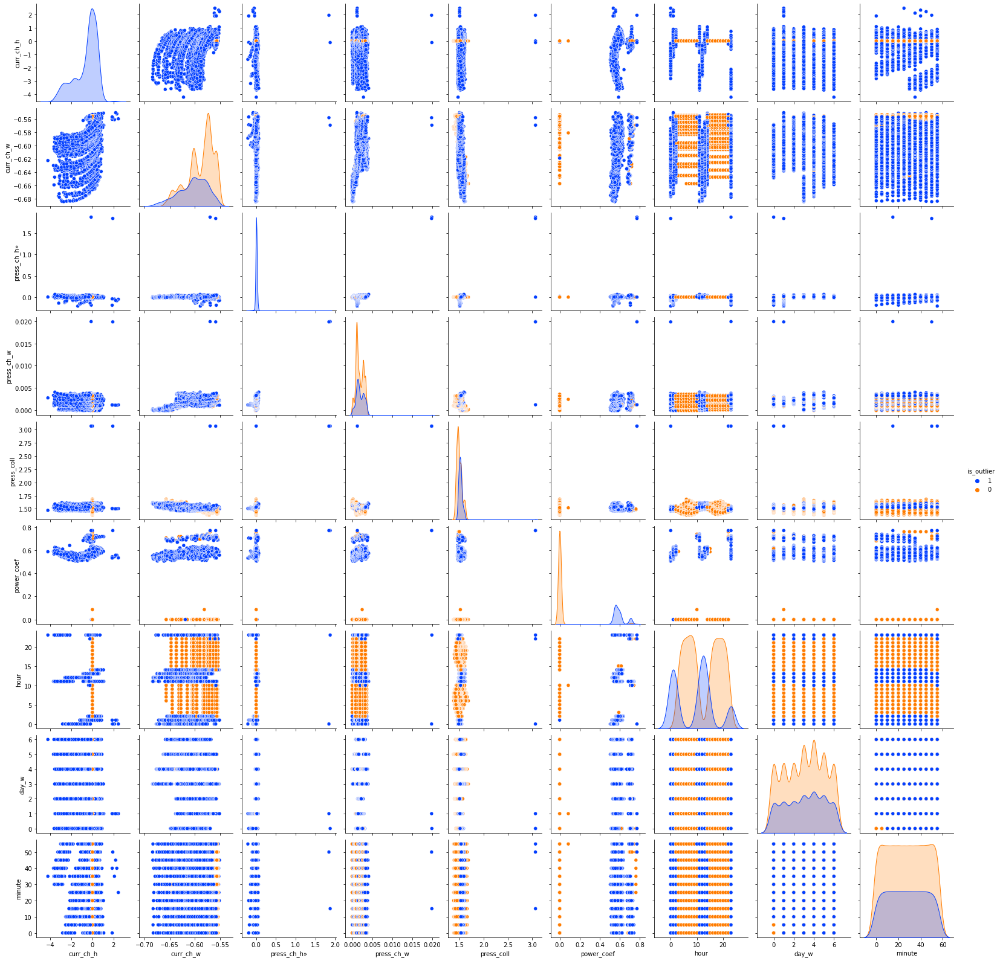

In [105]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = iqr_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
#              markers=['x', 'o'], 
             palette='bright');

***3. Кластеризация***

***Distance-based***

In [42]:
from sklearn.base import BaseEstimator
from scipy.spatial.distance import cdist
from sklearn.preprocessing import RobustScaler

class DistanceOutliers(BaseEstimator):
    """
    Distance based outlier detector model
    
    Fit method calculates centroid of training samples and
    using `metric` get distances from centroid to train samples.
    Having distances - we calculate `threshold` based on `percentile`.
    
    Predict method uses `threshold` and `metric` to determine, whether
    distance to sample from centroid is too large -> outlier.
    
    -----------
    Parameters:
    
    - metric: string, default - euclidean
        metric to use for distance calculation (see scipy.spatial.distance.cdist)
        
    - percentile: float in range [0, 100]
        hyperparameter which sets the threshold for anomalies
    """
    def __init__(self, metric='euclidean', percentile=90):
        self.metric = metric
        self.percentile = percentile
        
    def fit(self, X):
        self.centroid = np.mean(X, axis=0).values.reshape(-1, 1).T
        distances_train = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        self.threshold = np.percentile(distances_train, self.percentile)
        
    def predict(self, X):
        distances = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        predictions = (distances > self.threshold).astype(int)
        return predictions

In [99]:
scaler = RobustScaler()
scaled_data = pd.DataFrame(
    data=scaler.fit_transform(data_features), 
    columns=data_features.columns
)

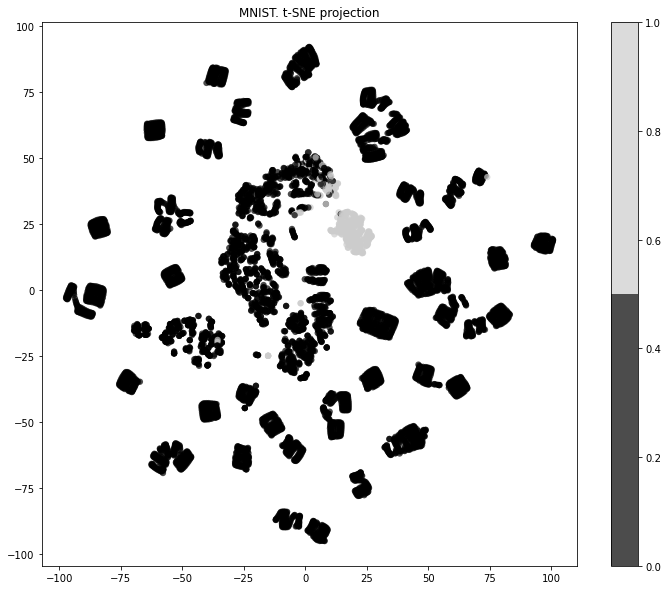

In [56]:
# Визуализация цифр из набора MNIST при помощи t-SNE.
from sklearn.manifold import TSNE
tsne = TSNE(random_state=17)
X_tsne = tsne.fit_transform(scaled_data)

colors = labeled_data['is_outlier']

plt.figure(figsize=(12,10))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=colors, 
            edgecolor='none', alpha=0.7, s=40,
            cmap=plt.cm.get_cmap('nipy_spectral', 2))
plt.colorbar()
plt.title('MNIST. t-SNE projection');

***3. Кластеризация***

***Distance-based***

In [57]:
from sklearn.base import BaseEstimator
from scipy.spatial.distance import cdist
from sklearn.preprocessing import RobustScaler

class DistanceOutliers(BaseEstimator):
    """
    Distance based outlier detector model
    
    Fit method calculates centroid of training samples and
    using `metric` get distances from centroid to train samples.
    Having distances - we calculate `threshold` based on `percentile`.
    
    Predict method uses `threshold` and `metric` to determine, whether
    distance to sample from centroid is too large -> outlier.
    
    -----------
    Parameters:
    
    - metric: string, default - euclidean
        metric to use for distance calculation (see scipy.spatial.distance.cdist)
        
    - percentile: float in range [0, 100]
        hyperparameter which sets the threshold for anomalies
    """
    def __init__(self, metric='euclidean', percentile=90):
        self.metric = metric
        self.percentile = percentile
        
    def fit(self, X):
        self.centroid = np.mean(X, axis=0).values.reshape(-1, 1).T
        distances_train = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        self.threshold = np.percentile(distances_train, self.percentile)
        
    def predict(self, X):
        distances = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        predictions = (distances > self.threshold).astype(int)
        return predictions

In [58]:
euclidian_model = DistanceOutliers(metric='euclidean', percentile=90)
euclidian_model.fit(scaled_data)
euclidian_outliers = euclidian_model.predict(scaled_data)
anomalies_report(euclidian_outliers)

Total number of outliers: 669
Percentage of outliers:   10.01%


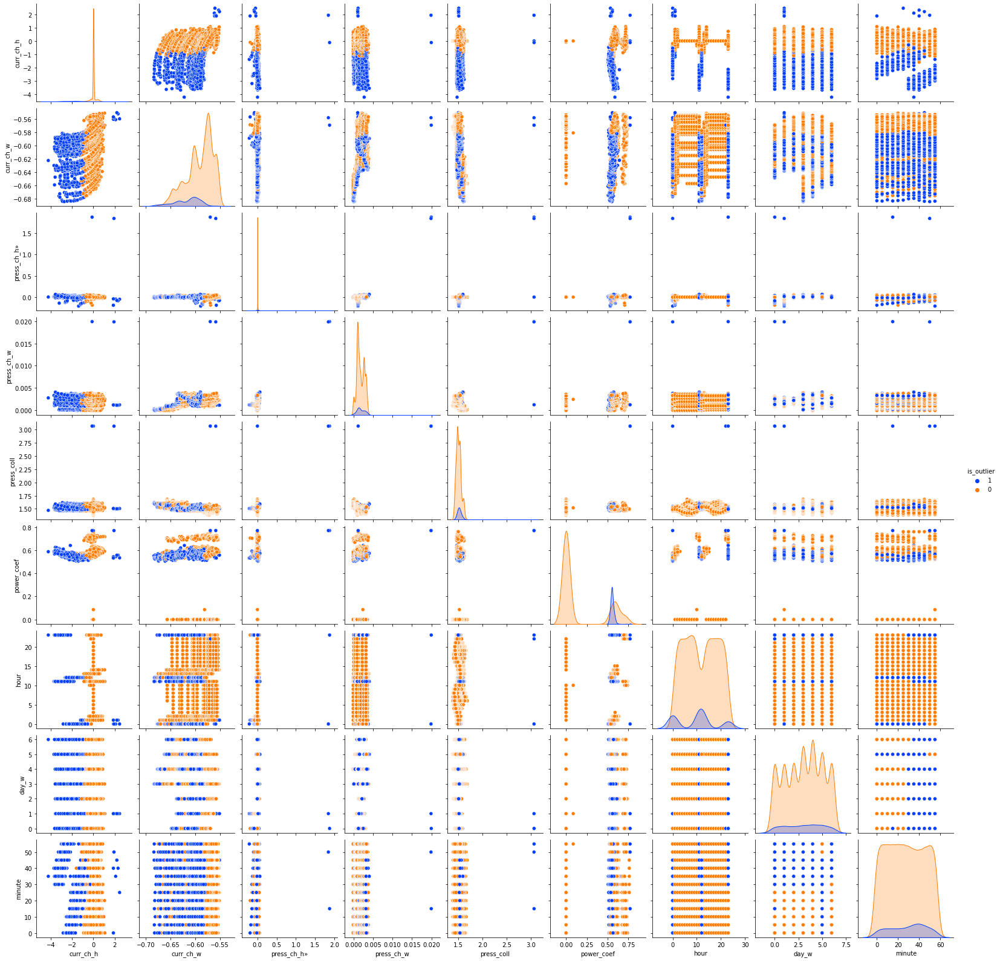

In [97]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = euclidian_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
#              markers=['x', 'o'],
             palette='bright');

In [106]:
plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=euclidian_outliers);

NameError: name 'tsne_transformed' is not defined

<Figure size 720x720 with 0 Axes>

**Density-based**


***DBSCAN***

In [73]:
from sklearn.cluster import DBSCAN

# для начала считаем все наблюдения аномальными
outlier_percentage = 1.

num_clusters = []
anomaly_percentage = []

# берем маленький эпсилон и начинаем увеличивать
eps = 0.05
eps_history = [eps]
while outlier_percentage>0.05:    
    model = DBSCAN(eps=eps).fit(scaled_data)
    labels = model.labels_
    num_clusters.append(len(np.unique(labels))-1)
    labels = np.array([1 if label == -1 else 0 for label in labels])
    # считаем текущий процент "шума"
    outlier_percentage = sum(labels==1) / len(labels)    
    eps += 0.05
    eps_history.append(eps)
    anomaly_percentage.append(outlier_percentage)
    
model = DBSCAN(eps)
model.fit(scaled_data)
density_outlier = np.array([1 if label == -1 else 0 for label in model.labels_])

In [86]:
model = DBSCAN(1.3)
model.fit(scaled_data)
density_outlier = np.array([1 if label == -1 else 0 for label in model.labels_])

In [87]:
anomalies_report(density_outlier)


Total number of outliers: 542
Percentage of outliers:   8.11%


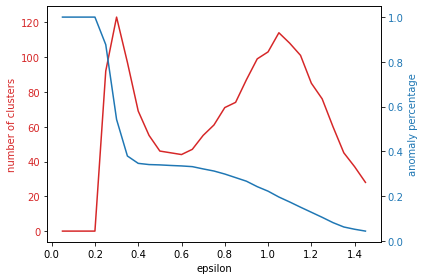

In [74]:
iterations = eps_history[:-1]

fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('epsilon')
ax1.set_ylabel('number of clusters', color=color)
ax1.plot(iterations, num_clusters, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('anomaly percentage', color=color)  # we already handled the x-label with ax1
ax2.plot(iterations, anomaly_percentage, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

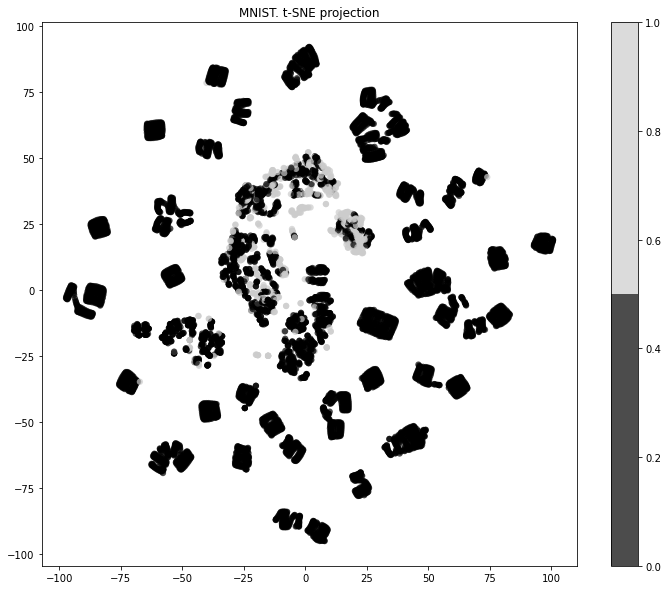

In [95]:
colors = density_outlier.copy()

plt.figure(figsize=(12,10))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=colors, 
            edgecolor='none', alpha=0.7, s=40,
            cmap=plt.cm.get_cmap('nipy_spectral', 2))
plt.colorbar()
plt.title('MNIST. t-SNE projection');

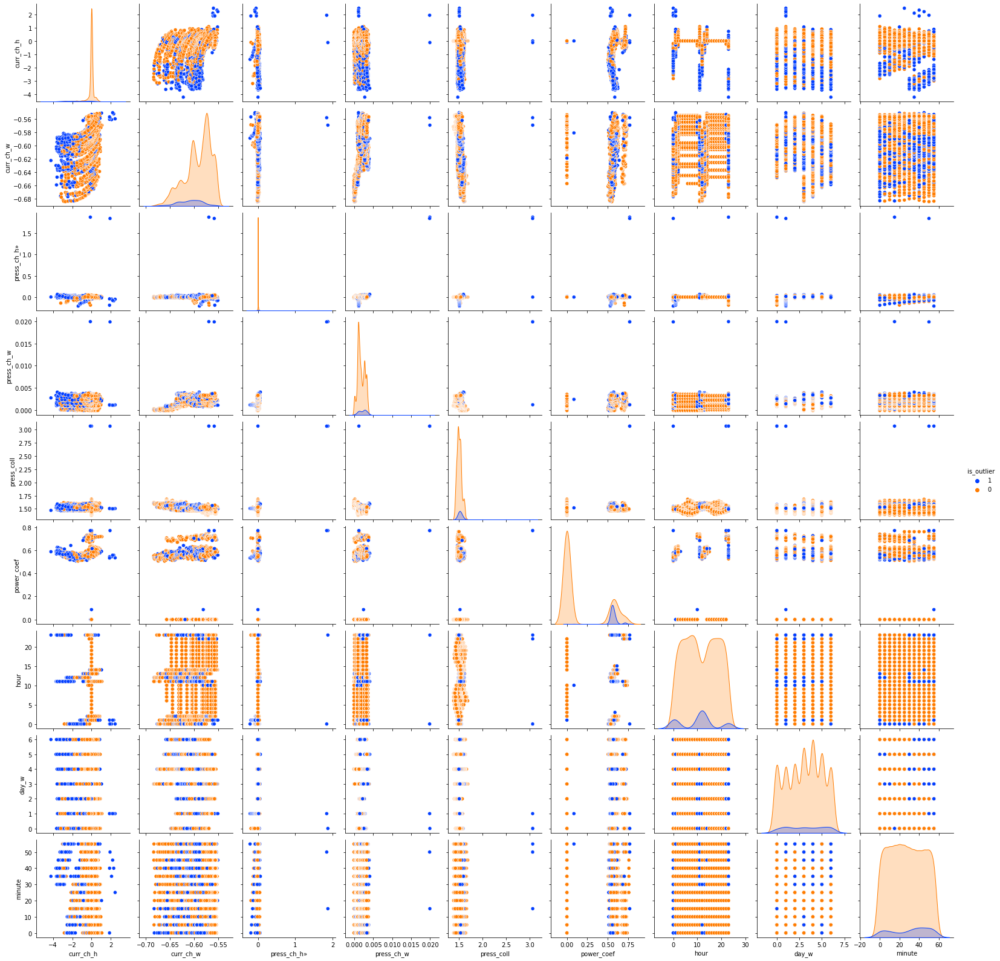

In [96]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = density_outlier


sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
#              markers=['x', 'o'],  
             palette='bright');

***4. Unsupervised model-based***


One-Class SVM


In [107]:
from sklearn.svm import OneClassSVM

one_class_svm = OneClassSVM(nu=0.1, gamma='auto')
one_class_svm.fit(scaled_data)
svm_outliers = one_class_svm.predict(scaled_data)
svm_outliers = np.array([1 if label == -1 else 0 for label in svm_outliers])

In [108]:
anomalies_report(svm_outliers)


Total number of outliers: 669
Percentage of outliers:   10.01%


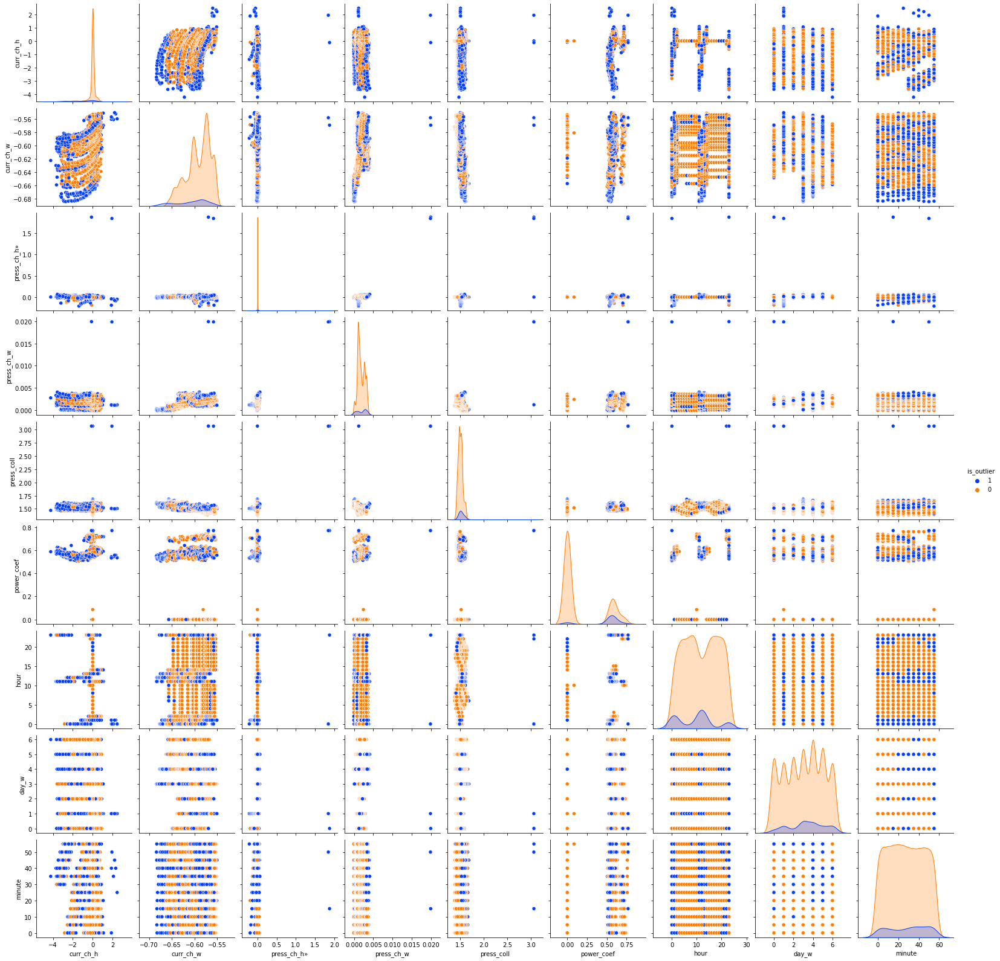

In [109]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = svm_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
#              markers=['x', 'o'],
             palette='bright');

Isolation Forest


In [110]:
from sklearn.ensemble import IsolationForest

isolation_forest = IsolationForest(n_estimators=100, contamination=0.1, 
                                   max_features=1.0, bootstrap=True, behaviour="new")
isolation_forest.fit(scaled_data)

isolation_outliers = isolation_forest.predict(scaled_data)
isolation_outliers = np.array([1 if label == -1 else 0 for label in isolation_outliers])

In [111]:
anomalies_report(isolation_outliers)


Total number of outliers: 669
Percentage of outliers:   10.01%


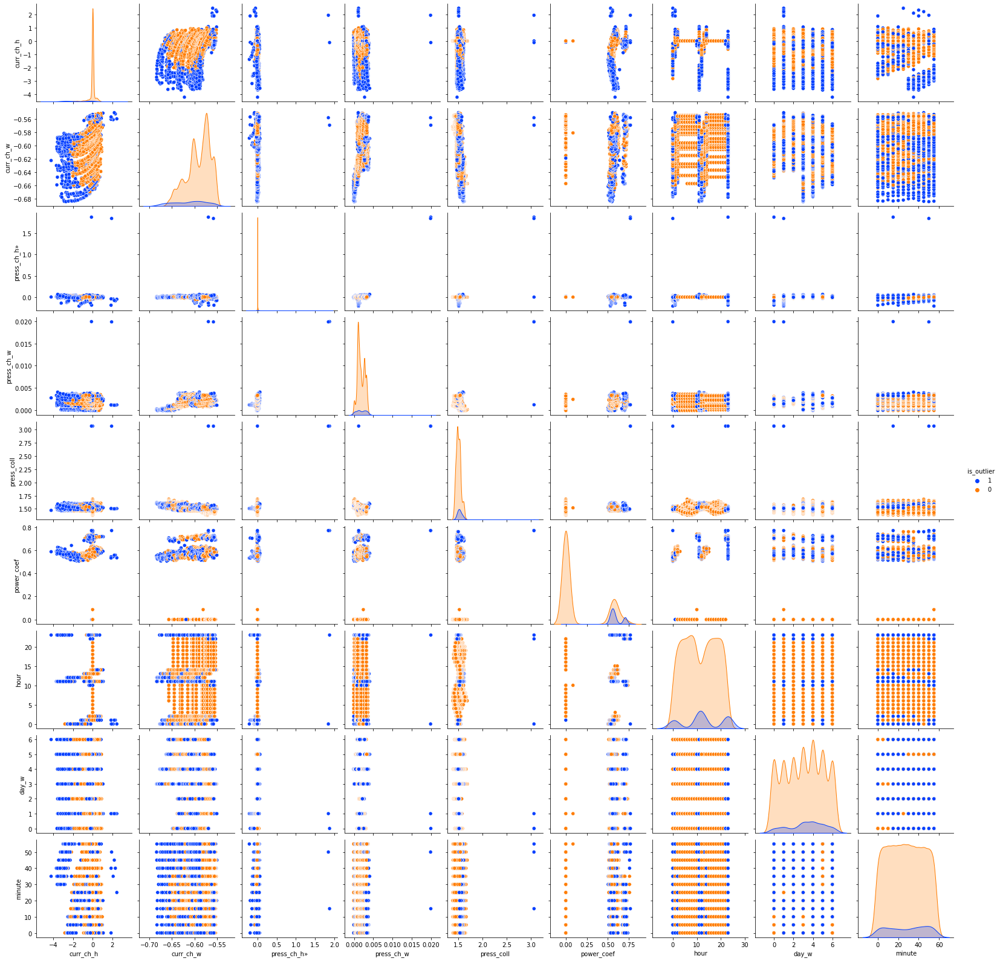

In [112]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = isolation_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
#              markers=['x', 'o'],
             palette='bright');

Финальное сравнение


In [114]:
summary = np.concatenate((
    [std_outliers], 
    [iqr_outliers], 
    [euclidian_outliers], 
#     [cityblock_outliers],
    [density_outlier],
    [svm_outliers],
    [isolation_outliers]
))

In [116]:
summary = pd.DataFrame(
    summary.T, 
    columns=['std', 'iqr', 'euclid', 
#              'cityblock',
             'dbscan', 'svm', 'isolation']
)
summary.head()

,std,iqr,euclid,dbscan,svm,isolation
0,0,0,0,0,0,0
1,0,0,0,0,1,0
2,0,0,0,0,1,0
3,0,0,0,0,1,0
4,0,0,0,0,1,0


In [117]:
summary.sum(axis=1).value_counts()


0    4390
1    1110
2     455
3     278
4     174
5     144
6     132
dtype: int64

<AxesSubplot:>

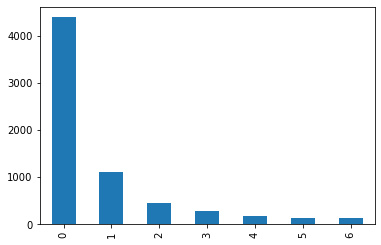

In [132]:
summary.sum(axis=1).value_counts().plot(kind='bar')

**All combined**


In [134]:
simple_score.value_counts()

0.0    5955
0.5     452
1.0     276
dtype: int64

In [157]:
data_features.shape

(6683, 18)

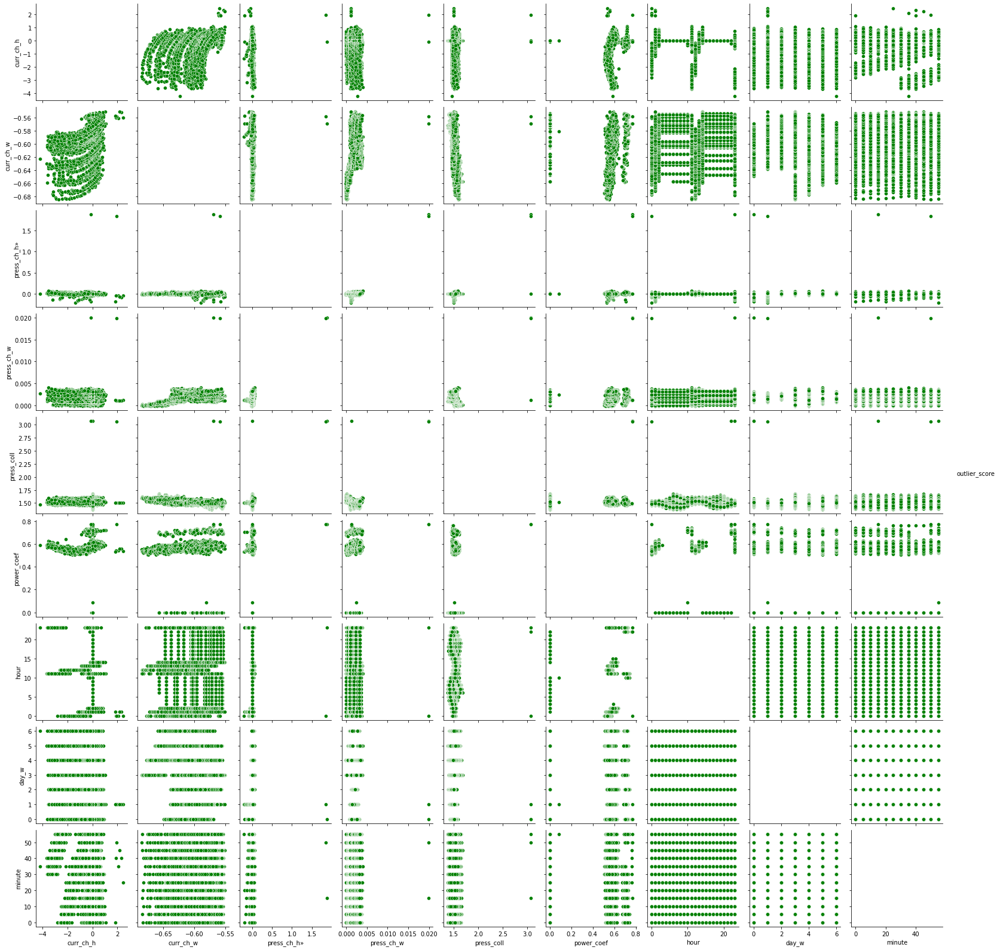

In [164]:
simple_score = outlier_score.apply(lambda x: 0 if x < 0.4 else 0.5 if x < 0.8 else 1)

labeled_data = data_features.copy()
# labeled_data['outlier_score'] = simple_score
labeled_data['outlier_score'] = np.round(simple_score,1)


# custom_palette = {0.0:'green', 0.5:'blue', 1.0:'red'}
customPalette = sns.set_palette(sns.color_palette(['g','b','r']))

sns.pairplot(data=labeled_data, vars=other_features, 
             hue='outlier_score',
             hue_order=[1.0, 0.5, 0.0],
             palette= customPalette

)

Just model based

0    5537
1     616
2     326
3     204
dtype: int64

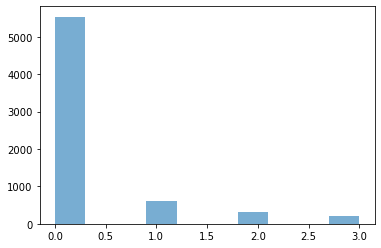

In [120]:
outliers_score_model_based = summary[['dbscan', 'svm', 'isolation']].sum(axis=1)
plt.hist(outliers_score_model_based, alpha=0.6);
outliers_score_model_based.value_counts()

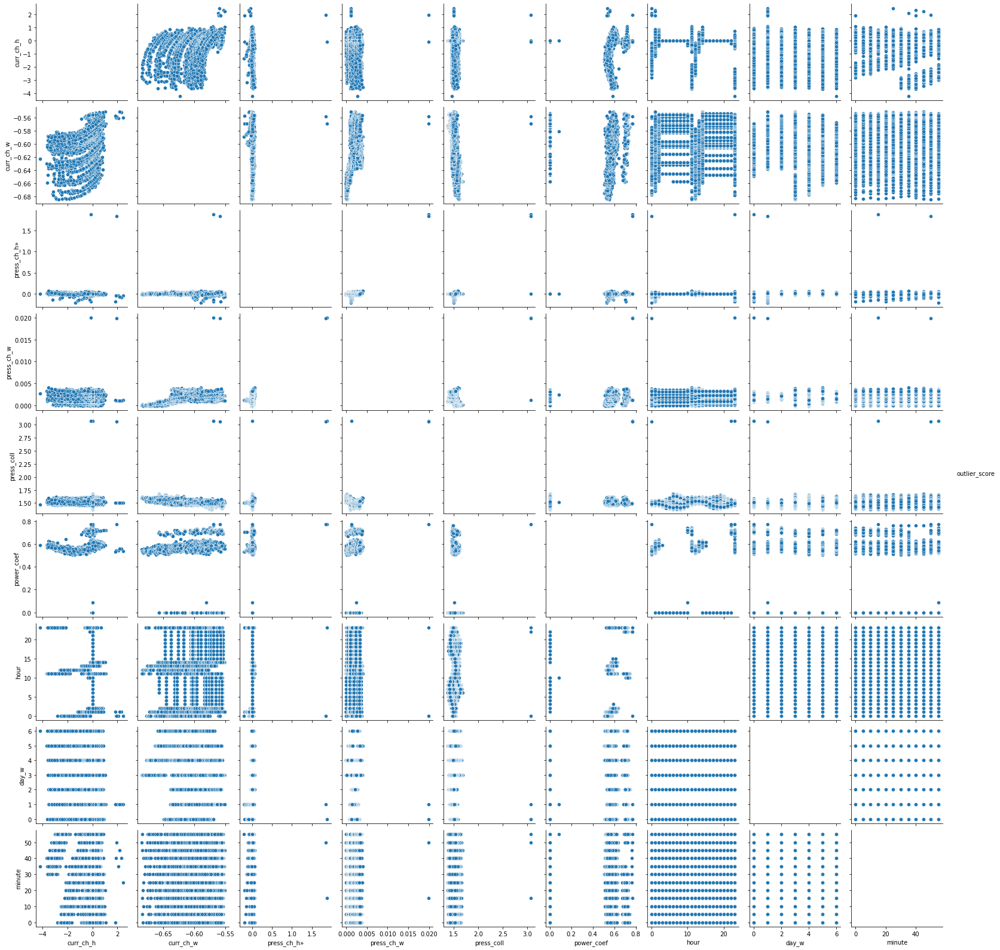

In [121]:
labeled_data = data_features.copy()
labeled_data['outlier_score'] = outliers_score_model_based

custom_palette = {0:'g', 1:'b', 2:'y', 3:'r'}

sns.pairplot(data=labeled_data, vars=other_features, 
             hue='outlier_score',
             hue_order=[3, 2, 1, 0],
             palette=custom_palette
)

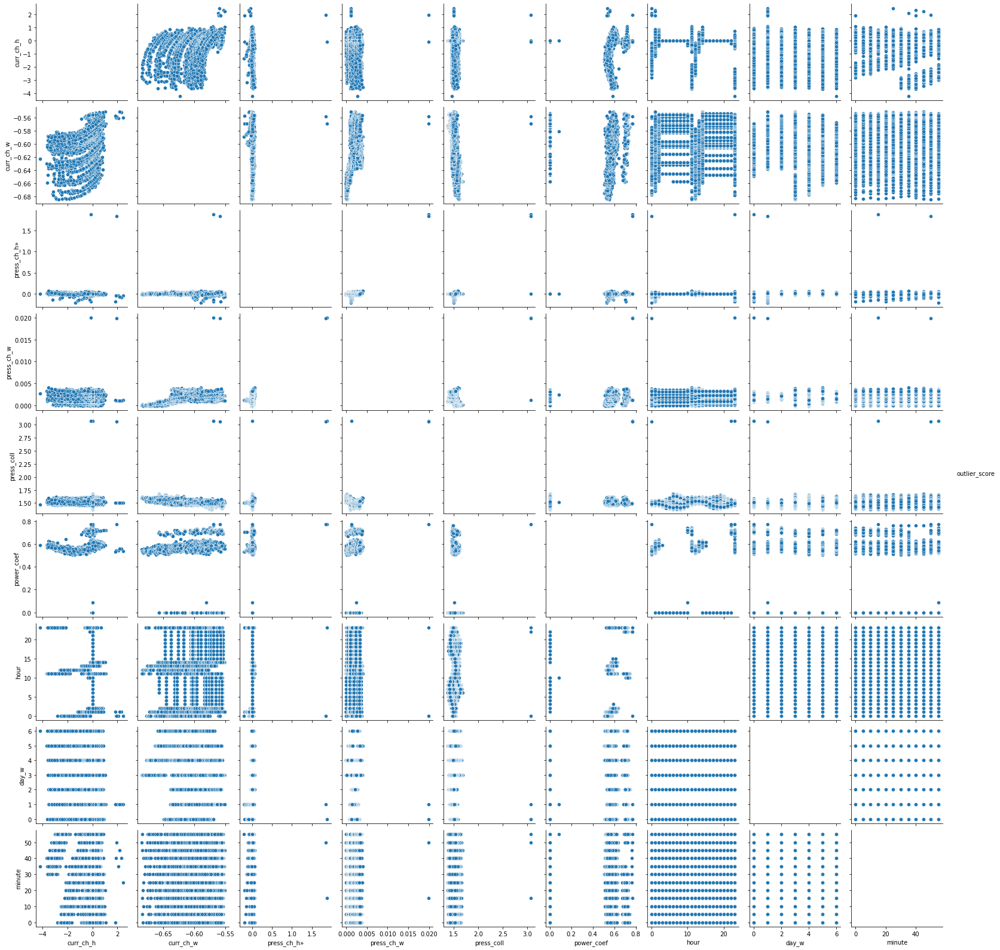

In [122]:
sns.pairplot(data=labeled_data[labeled_data.outlier_score!=3],
             vars=other_features, 
             hue='outlier_score',
             hue_order=[3, 2, 1, 0],
             palette=custom_palette
)

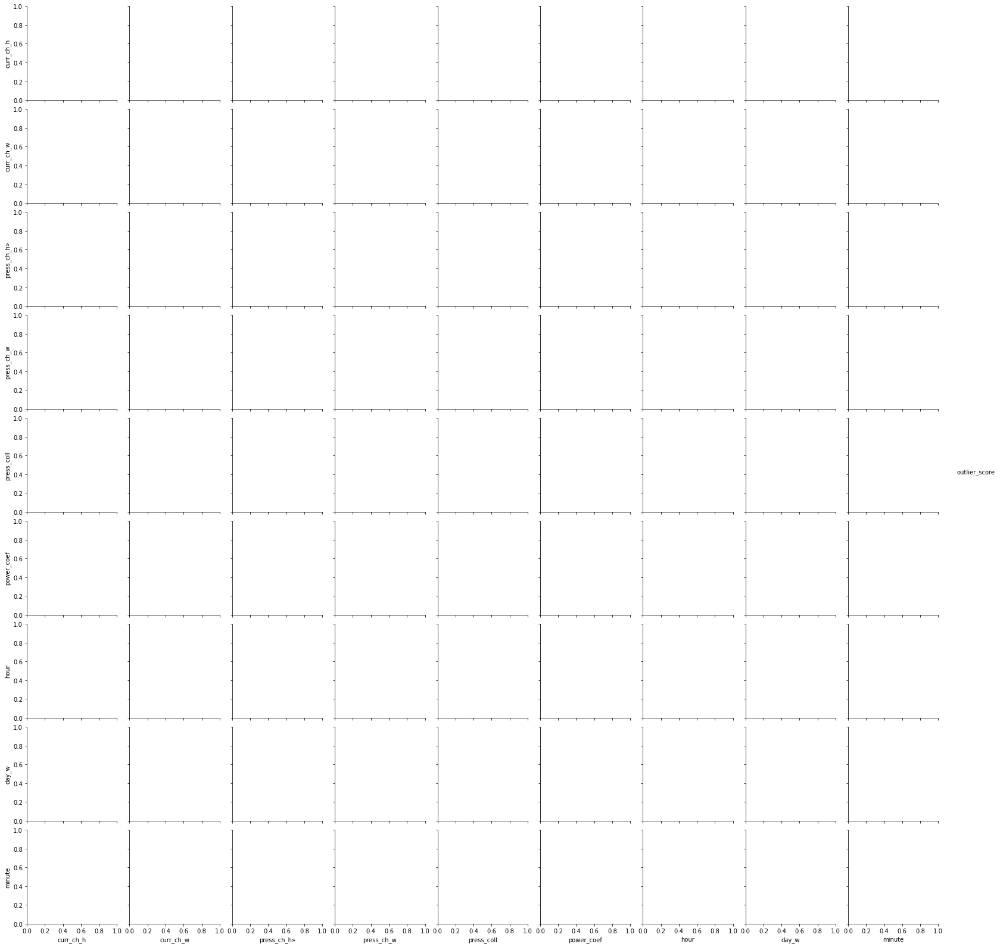

In [123]:
sns.pairplot(data=labeled_data[labeled_data.outlier_score.isin([0, 1])],
             vars=other_features, 
             hue='outlier_score',
             hue_order=[3, 2, 1, 0],
             palette=custom_palette
)

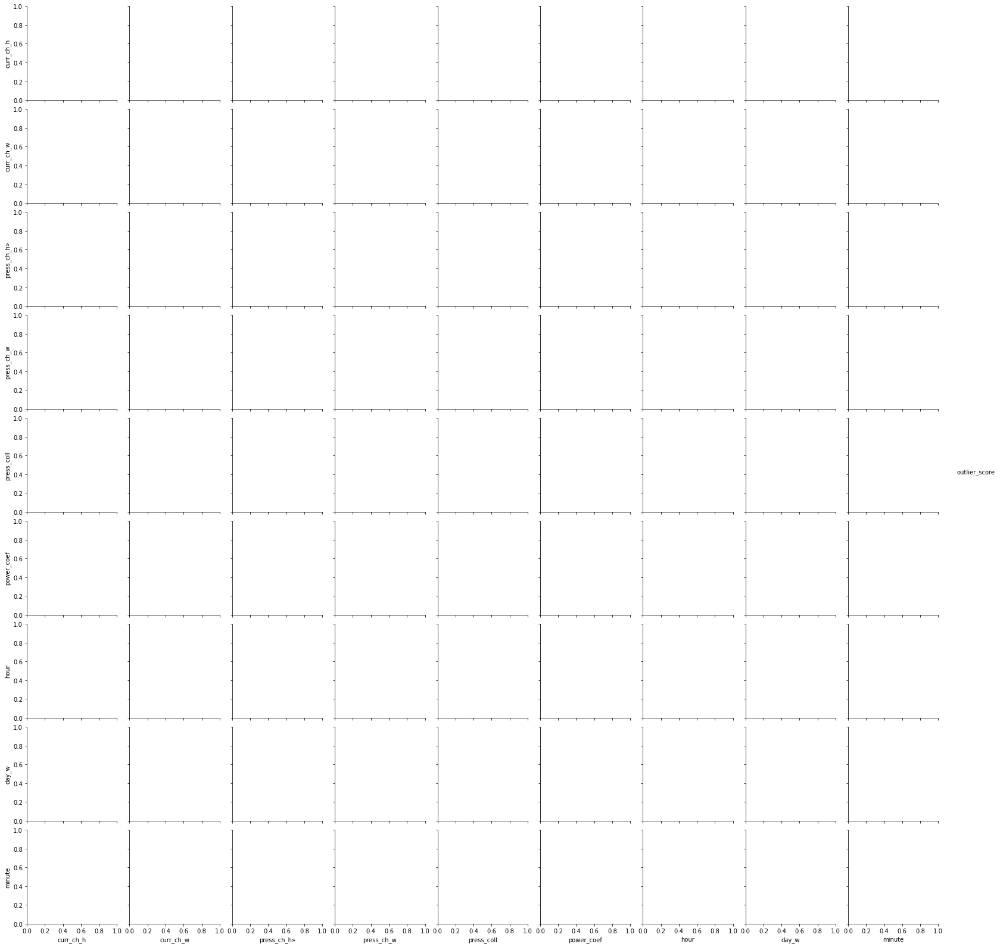

In [124]:
sns.pairplot(data=labeled_data[labeled_data.outlier_score.isin([0])],
             vars=other_features, 
             hue='outlier_score',
             hue_order=[3, 2, 1, 0],
             palette=custom_palette
)

In [98]:
from sklearn.metrics import (roc_auc_score, recall_score, f1_score, precision_score,
                            accuracy_score)
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
    

In [364]:
#Random Forest

#кросс-валидация, подбор гипер-параметров
# skf = StratifiedKFold(n_splits=5)  # CV type по умолчанию для binary или multiclass
skf = KFold(n_splits=5, shuffle=False)

pipe_rndforest = Pipeline([
#     ('scl', preprocessor),
                           ('reg', RandomForestRegressor( random_state=13))
                        ])  # pipeline with all steps
param_dict_rndforest = {
#     'reg__max_depth': np.arange(1,10),
#                         'reg__min_samples_leaf': np.arange(1, 10),
                        'reg__n_estimators': [100, 200, 300]
                       }

rndforest_randomized_pipe_2sigma = RandomizedSearchCV(estimator=pipe_rndforest,
                                              param_distributions=param_dict_rndforest,
                                               error_score="neg_mean_squared_error",
                                              cv=skf, n_iter=30, n_jobs=-1)

In [242]:
rndforest_randomized_pipe_2sigma.fit(X_one_id_train, y_one_id_train['2sigma'])

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
                   error_score='neg_mean_squared_error',
                   estimator=Pipeline(memory=None,
                                      steps=[('reg',
                                              RandomForestRegressor(bootstrap=True,
                                                                    ccp_alpha=0.0,
                                                                    criterion='mse',
                                                                    max_depth=None,
                                                                    max_features='auto',
                                                                    max_leaf_nodes=None,
                                                                    max_samples=None,
                                                                    min_impurity_decrease=0.0,
                                                                    m

In [246]:
y_one_id_test_2sigma = y_one_id_test['2sigma']

In [247]:
y_one_id_test_2sigma

DT
2019-07-20 13:00:00    0
2019-07-20 13:05:00    0
2019-07-20 13:10:00    0
2019-07-20 13:15:00    0
2019-07-20 13:20:00    0
                      ..
2019-07-31 23:35:00    1
2019-07-31 23:40:00    1
2019-07-31 23:45:00    1
2019-07-31 23:50:00    1
2019-07-31 23:55:00    0
Name: 2sigma, Length: 3292, dtype: int64

In [338]:
model_predict = rndforest_randomized_pipe_2sigma.predict(X_one_id_test)
pred = np.round(model_predict, 0)
print('accuracy_score:', accuracy_score(y_one_id_test_2sigma, pred),
      'recall_score:',recall_score(y_one_id_test_2sigma, pred),
      'f1_score:',f1_score(y_one_id_test_2sigma, pred),
'precision_score:',precision_score(y_one_id_test_2sigma, pred),
    'roc_auc_score:',roc_auc_score(y_one_id_test_2sigma, pred))

accuracy_score: 0.9921020656136087 recall_score: 0.921875 f1_score: 0.9315789473684212 precision_score: 0.9414893617021277 roc_auc_score: 0.9591633064516129


In [348]:
models_score = model_validate_other_wells(pumps,data_prep,model=rndforest_randomized_pipe_2sigma)
models_score

(9990, 17) (9990,)
 2sigma outlined: 724 of 9990 
 3sigma outlined: 0 of 9990
(9578, 17) (9578,)
 2sigma outlined: 1995 of 9578 
 3sigma outlined: 1302 of 9578
(9992, 17) (9992,)
 2sigma outlined: 1122 of 9992 
 3sigma outlined: 641 of 9992
(9607, 17) (9607,)
 2sigma outlined: 278 of 9607 
 3sigma outlined: 220 of 9607
(3180, 17) (3180,)
 2sigma outlined: 11 of 3180 
 3sigma outlined: 0 of 3180
(9981, 17) (9981,)
 2sigma outlined: 1371 of 9981 
 3sigma outlined: 601 of 9981
(9600, 17) (9600,)
 2sigma outlined: 1112 of 9600 
 3sigma outlined: 31 of 9600
(9998, 17) (9998,)
 2sigma outlined: 1710 of 9998 
 3sigma outlined: 895 of 9998
(9706, 17) (9706,)
 2sigma outlined: 0 of 9706 
 3sigma outlined: 0 of 9706
(9987, 17) (9987,)
 2sigma outlined: 537 of 9987 
 3sigma outlined: 4 of 9987
(9982, 17) (9982,)
 2sigma outlined: 14 of 9982 
 3sigma outlined: 0 of 9982
(9987, 17) (9987,)
 2sigma outlined: 3213 of 9987 
 3sigma outlined: 2506 of 9987
(8725, 17) (8725,)
 2sigma outlined: 526 of 872

,recall_score,accuracy_score,f1_score,model_name,roc_auc_score,precision_score,well_id
0,1.000000,0.776476,0.393371,"RandomizedSearchCV(cv=KFold(n_splits=5, random...",0.879506,0.244843,226003330.0
1,0.631078,0.923157,0.773817,"RandomizedSearchCV(cv=KFold(n_splits=5, random...",0.815539,1.000000,226003074.0
2,1.000000,0.980785,0.921182,"RandomizedSearchCV(cv=KFold(n_splits=5, random...",0.989177,0.853881,226002627.0
3,0.841727,0.980119,0.710167,"RandomizedSearchCV(cv=KFold(n_splits=5, random...",0.912985,0.614173,226002307.0
4,0.181818,0.972013,0.043011,"RandomizedSearchCV(cv=KFold(n_splits=5, random...",0.578287,0.024390,226002148.0
5,0.983224,0.878269,0.689338,"RandomizedSearchCV(cv=KFold(n_splits=5, random...",0.922390,0.530709,226000198.0
6,0.973921,0.817708,0.553115,"RandomizedSearchCV(cv=KFold(n_splits=5, random...",0.885582,0.386234,226003080.0
7,0.926316,0.913283,0.785130,"RandomizedSearchCV(cv=KFold(n_splits=5, random...",0.918455,0.681290,226000297.0
8,0.000000,0.987533,0.000000,"RandomizedSearchCV(cv=KFold(n_splits=5, random...",NaN,0.000000,226002603.0
9,0.461825,0.969460,0.619226,"RandomizedSearchCV(cv=KFold(n_splits=5, random...",0.730066,0.939394,226002861.0


***для всех насосов сразу***

In [389]:
#Random Forest Для всех

#кросс-валидация, подбор гипер-параметров
# skf = StratifiedKFold(n_splits=5)  # CV type по умолчанию для binary или multiclass
skf = KFold(n_splits=5, shuffle=False)

pipe_rndforest = Pipeline([
#     ('scl', preprocessor),
                           ('reg', RandomForestRegressor( random_state=13))
                        ])  # pipeline with all steps
param_dict_rndforest = {
#     'reg__max_depth': np.arange(1,10),
#                         'reg__min_samples_leaf': np.arange(1, 10),
                        'reg__n_estimators': [100, 200, 300]
                       }

rndforest_randomized_pipe_2sigma_all = RandomizedSearchCV(estimator=pipe_rndforest,
                                              param_distributions=param_dict_rndforest,
                                               error_score="neg_mean_squared_error",
                                              cv=skf, n_iter=30, n_jobs=-1)

In [386]:
sigma_outline(y_all)
sigma_add(y_all)

 2sigma outlined: 16509 of 160262 
 3sigma outlined: 7097 of 160262


In [395]:
y_all = y_all[['2sigma']]

In [396]:
rndforest_randomized_pipe_2sigma_all.fit(X_all, y_all)

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
                   error_score='neg_mean_squared_error',
                   estimator=Pipeline(memory=None,
                                      steps=[('reg',
                                              RandomForestRegressor(bootstrap=True,
                                                                    ccp_alpha=0.0,
                                                                    criterion='mse',
                                                                    max_depth=None,
                                                                    max_features='auto',
                                                                    max_leaf_nodes=None,
                                                                    max_samples=None,
                                                                    min_impurity_decrease=0.0,
                                                                    m

In [403]:
models_score = model_validate_other_wells(pumps,data_valid_prep,model=rndforest_randomized_pipe_2sigma_all)
models_score

(1663, 18) (1663,)
 2sigma outlined: 381 of 1663 
 3sigma outlined: 0 of 1663
(963, 18) (963,)
 2sigma outlined: 282 of 963 
 3sigma outlined: 108 of 963
(1667, 18) (1667,)
 2sigma outlined: 178 of 1667 
 3sigma outlined: 114 of 1667
(1654, 18) (1654,)
 2sigma outlined: 43 of 1654 
 3sigma outlined: 29 of 1654
(0, 18) (0,)


ValueError: left side of interval must be <= right side

In [406]:
2sigma_out(pump)

ValueError: left side of interval must be <= right side

In [392]:
rndforest_randomized_pipe_2sigma_all.predict(X_one_id_test)

array([[-0.30391873,  0.        ,  0.        ],
       [-0.29915602,  0.        ,  0.        ],
       [-0.29596705,  0.        ,  0.        ],
       ...,
       [-0.70650871,  1.        ,  0.        ],
       [-0.66044063,  0.76      ,  0.        ],
       [-0.6216143 ,  0.09      ,  0.        ]])

In [339]:
y_one_id_test['rndforest_randomized_pipe_2sigma'] = pred
y_one_id_test

,targ_press_h,2sigma,3sigma,rndforest_randomized_pipe_2sigma
DT,,,,
2019-07-20 13:00:00,-0.297079,0,0,0.0
2019-07-20 13:05:00,-0.296171,0,0,0.0
2019-07-20 13:10:00,-0.294154,0,0,0.0
2019-07-20 13:15:00,-0.289938,0,0,0.0
2019-07-20 13:20:00,-0.289745,0,0,0.0
...,...,...,...,...
2019-07-31 23:35:00,-0.826162,1,0,1.0
2019-07-31 23:40:00,-0.765146,1,0,1.0
2019-07-31 23:45:00,-0.713831,1,0,1.0


In [253]:
y_one_id_test[y_one_id_test['rndforest_randomized_pipe_2sigma']==1]

,targ_press_h,2sigma,3sigma,rndforest_randomized_pipe_2sigma
DT,,,,
2019-07-20 23:15:00,-0.733878,1,0,1.0
2019-07-20 23:20:00,-0.823690,1,0,1.0
2019-07-20 23:25:00,-0.900921,1,0,1.0
2019-07-20 23:30:00,-0.912829,1,1,1.0
2019-07-20 23:35:00,-0.868346,1,0,1.0
...,...,...,...,...
2019-07-31 23:25:00,-0.920842,1,1,1.0
2019-07-31 23:30:00,-0.877958,1,0,1.0
2019-07-31 23:35:00,-0.826162,1,0,1.0


In [113]:
reset_y_train = y_train.reset_index()
print(reset_y_train)
reset_y_train['WELL_ID'].nunique()
y = reset_y_train[reset_y_train['WELL_ID'] == 226000188]

          WELL_ID                  DT  targ_press_h
0       226000188 2019-06-27 06:40:00        0.0000
1       226000188 2019-06-27 06:45:00        0.0000
2       226000188 2019-06-27 06:50:00        0.0000
3       226000188 2019-06-27 06:55:00        0.0000
4       226000188 2019-06-27 07:00:00        0.0000
...           ...                 ...           ...
160257  226003330 2019-07-31 23:35:00        0.0000
160258  226003330 2019-07-31 23:40:00        0.0000
160259  226003330 2019-07-31 23:45:00        0.0000
160260  226003330 2019-07-31 23:50:00        0.0000
160261  226003330 2019-07-31 23:55:00       -0.1344

[160262 rows x 3 columns]


In [114]:
y.drop(['WELL_ID'], axis=1, inplace=True)

In [115]:
y = y.set_index('DT')

<AxesSubplot:>

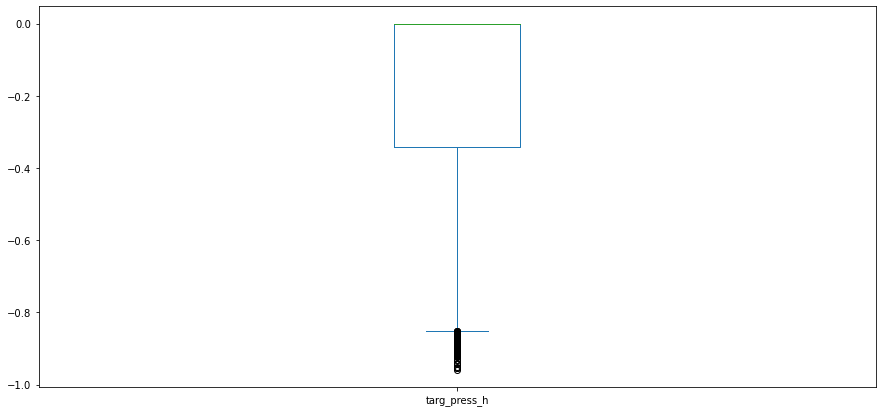

In [272]:
y.plot(kind='box')

In [280]:
y = y_one_id_test.copy()
y.drop(['2sigma','3sigma','rndforest_randomized_pipe_2sigma'], axis=1, inplace=True)
y

,targ_press_h
DT,
2019-07-20 13:00:00,-0.297079
2019-07-20 13:05:00,-0.296171
2019-07-20 13:10:00,-0.294154
2019-07-20 13:15:00,-0.289938
2019-07-20 13:20:00,-0.289745
...,...
2019-07-31 23:35:00,-0.826162
2019-07-31 23:40:00,-0.765146
2019-07-31 23:45:00,-0.713831


In [288]:
#Random Forest для давления

#кросс-валидация, подбор гипер-параметров
skf = KFold(n_splits=5)

pipe_rndforest = Pipeline([ ('reg', RandomForestRegressor( random_state=13))
                        ])  # pipeline with all steps
param_dict_rndforest = {
                        'reg__n_estimators': [100, 200, 300]
                       }

rndforest_randomized_pipe_target_pressure = RandomizedSearchCV(estimator=pipe_rndforest,
                                              param_distributions=param_dict_rndforest,
                                               error_score="neg_mean_squared_error",
                                              cv=skf, n_iter=30, n_jobs=-1)

In [289]:
rndforest_randomized_pipe_target_pressure.fit(X_one_id_train, y_one_id_train['targ_press_h'])

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
                   error_score='neg_mean_squared_error',
                   estimator=Pipeline(memory=None,
                                      steps=[('reg',
                                              RandomForestRegressor(bootstrap=True,
                                                                    ccp_alpha=0.0,
                                                                    criterion='mse',
                                                                    max_depth=None,
                                                                    max_features='auto',
                                                                    max_leaf_nodes=None,
                                                                    max_samples=None,
                                                                    min_impurity_decrease=0.0,
                                                                    m

In [290]:
y_one_id_test
# y_one_id_test = pd.DataFrame(y_one_id_test, columns=['targ_press_h'])

,targ_press_h,2sigma,3sigma,rndforest_randomized_pipe_2sigma
DT,,,,
2019-07-20 13:00:00,-0.297079,0,0,0.0
2019-07-20 13:05:00,-0.296171,0,0,0.0
2019-07-20 13:10:00,-0.294154,0,0,0.0
2019-07-20 13:15:00,-0.289938,0,0,0.0
2019-07-20 13:20:00,-0.289745,0,0,0.0
...,...,...,...,...
2019-07-31 23:35:00,-0.826162,1,0,1.0
2019-07-31 23:40:00,-0.765146,1,0,1.0
2019-07-31 23:45:00,-0.713831,1,0,1.0


In [293]:
y_one_id_test_press = pd.DataFrame(y_one_id_test, columns=['targ_press_h'])
y_one_id_test_press

,targ_press_h
DT,
2019-07-20 13:00:00,-0.297079
2019-07-20 13:05:00,-0.296171
2019-07-20 13:10:00,-0.294154
2019-07-20 13:15:00,-0.289938
2019-07-20 13:20:00,-0.289745
...,...
2019-07-31 23:35:00,-0.826162
2019-07-31 23:40:00,-0.765146
2019-07-31 23:45:00,-0.713831


In [296]:
model_predict_pressure = rndforest_randomized_pipe_target_pressure.predict(X_one_id_test)
pred_1 = np.round(model_predict_pressure, 0)
print('accuracy_score:', accuracy_score(y_one_id_test_press, model_predict_pressure),
      'recall_score:',recall_score(y_one_id_test_press, model_predict_pressure),
      'f1_score:',f1_score(y_one_id_test_press, model_predict_pressure),
'precision_score:',precision_score(y_one_id_test_press, model_predict_pressure),
    'roc_auc_score:',roc_auc_score(y_one_id_test_press, model_predict_pressure))

ValueError: continuous is not supported

In [258]:
# init setup
from pycaret.anomaly import *
s = setup(y, session_id = 123)

,Description,Value
0,session_id,123
1,Original Data,"(3292, 1)"
2,Missing Values,False
3,Numeric Features,1
4,Categorical Features,0
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(3292, 1)"
9,CPU Jobs,-1


In [126]:
s1 = setup(X_train, session_id = 124)

,Description,Value
0,session_id,124
1,Original Data,"(160262, 17)"
2,Missing Values,False
3,Numeric Features,16
4,Categorical Features,1
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(160262, 23)"
9,CPU Jobs,-1


In [259]:
# train model
iforestx = create_model('iforest', fraction = 0.01)
iforestx_results = assign_model(iforestx)
iforestx_results.head()
iforestx_results[iforestx_results['Anomaly'] == 1]

,targ_press_h,Anomaly,Anomaly_Score
DT,,,
2019-07-20 23:25:00,-0.900921,1,0.038521
2019-07-20 23:30:00,-0.912829,1,0.052789
2019-07-21 10:55:00,-0.183600,1,0.007238
2019-07-21 11:30:00,-0.911264,1,0.050804
2019-07-21 11:35:00,-0.893337,1,0.024529
2019-07-22 11:25:00,-0.888914,1,0.012286
2019-07-22 11:30:00,-0.910423,1,0.050309
2019-07-22 23:25:00,-0.924055,1,0.058776
2019-07-22 23:30:00,-0.918050,1,0.057775


In [262]:
pycaret_res = iforestx_results[iforestx_results['Anomaly'] == 1]
len(pycaret_res)

33

In [407]:
y_one_id_test['3sigma'].sum()

KeyError: '3sigma'

In [356]:
result_compare_pycaret_2sigma = iforestx_results[iforestx_results['Anomaly'] == 1].join(y_one_id_test[y_one_id_test['2sigma'] == 1],
                                                          lsuffix='_iforest',rsuffix='_2sigma',how='outer')
result_compare_pycaret_2sigma

,targ_press_h_iforest,Anomaly,Anomaly_Score,targ_press_h_2sigma,2sigma,3sigma,rndforest_randomized_pipe_2sigma
DT,,,,,,,
2019-07-20 23:15:00,NaN,NaN,NaN,-0.733878,1.0,0.0,1.0
2019-07-20 23:20:00,NaN,NaN,NaN,-0.823690,1.0,0.0,1.0
2019-07-20 23:25:00,-0.900921,1.0,0.038521,-0.900921,1.0,0.0,1.0
2019-07-20 23:30:00,-0.912829,1.0,0.052789,-0.912829,1.0,1.0,1.0
2019-07-20 23:35:00,NaN,NaN,NaN,-0.868346,1.0,0.0,1.0
...,...,...,...,...,...,...,...
2019-07-31 23:30:00,NaN,NaN,NaN,-0.877958,1.0,0.0,1.0
2019-07-31 23:35:00,NaN,NaN,NaN,-0.826162,1.0,0.0,1.0
2019-07-31 23:40:00,NaN,NaN,NaN,-0.765146,1.0,0.0,1.0


In [280]:
# train model
iforest = create_model('iforest', fraction = 0.01)
iforest_results = assign_model(iforest)
iforest_results.head()

,targ_press_h,Anomaly,Anomaly_Score
DT,,,
2019-06-27 06:40:00,0.0,0,-0.249894
2019-06-27 06:45:00,0.0,0,-0.249894
2019-06-27 06:50:00,0.0,0,-0.249894
2019-06-27 06:55:00,0.0,0,-0.249894
2019-06-27 07:00:00,0.0,0,-0.249894


In [107]:
models()

,Name,Reference
ID,,
abod,Angle-base Outlier Detection,pyod.models.abod.ABOD
cluster,Clustering-Based Local Outlier,pyod.models.cblof.CBLOF
cof,Connectivity-Based Local Outlier,pyod.models.cof.COF
iforest,Isolation Forest,pyod.models.iforest.IForest
histogram,Histogram-based Outlier Detection,pyod.models.hbos.HBOS
knn,K-Nearest Neighbors Detector,pyod.models.knn.KNN
lof,Local Outlier Factor,pyod.models.lof.LOF
svm,One-class SVM detector,pyod.models.ocsvm.OCSVM
pca,Principal Component Analysis,pyod.models.pca.PCA


Найти похожий кейс, расставить ссылки 
google scholar
введение - актуальность
ссылка на учебник

In [108]:
# train model 2
lof_model = create_model('lof', fraction = 0.01)
lof_model_results = assign_model(lof_model)
lof_model_results.head()

,targ_press_h,Anomaly,Anomaly_Score
DT,,,
2019-06-27 06:40:00,0.0,0,1.0
2019-06-27 06:45:00,0.0,0,1.0
2019-06-27 06:50:00,0.0,0,1.0
2019-06-27 06:55:00,0.0,0,1.0
2019-06-27 07:00:00,0.0,0,1.0


In [110]:
len(lof_model_results[lof_model_results['Anomaly'] == 1])

100

In [103]:
len(iforest_results[iforest_results['Anomaly'] == 1])

96

In [125]:
result_compare = lof_model_results[lof_model_results['Anomaly'] == 1].join(iforest_results[iforest_results['Anomaly'] == 1],
                                                          lsuffix='_lof',rsuffix='_iforest',how='outer')
result_compare[result_compare.isna().sum(axis=1)==0]

,targ_press_h_lof,Anomaly_lof,Anomaly_Score_lof,targ_press_h_iforest,Anomaly_iforest,Anomaly_Score_iforest
DT,,,,,,
2019-06-27 11:40:00,-0.900049,1.0,1.286005,-0.900049,1.0,0.014935
2019-06-29 23:40:00,-0.901783,1.0,1.372732,-0.901783,1.0,0.018777
2019-07-06 23:35:00,-0.941540,1.0,2.009205,-0.941540,1.0,0.054731
2019-07-06 23:40:00,-0.919386,1.0,1.217402,-0.919386,1.0,0.040206
2019-07-07 11:35:00,-0.941605,1.0,2.011616,-0.941605,1.0,0.054731
2019-07-07 23:35:00,-0.953498,1.0,2.480302,-0.953498,1.0,0.055236
2019-07-08 11:35:00,-0.919162,1.0,1.205997,-0.919162,1.0,0.040206
2019-07-08 23:35:00,-0.940442,1.0,1.968303,-0.940442,1.0,0.054225
2019-07-08 23:40:00,-0.902798,1.0,1.366471,-0.902798,1.0,0.020633


In [56]:
# check anomalies
iforest_results[iforest_results['Anomaly'] == 1].head()

,targ_press_h,Anomaly,Anomaly_Score
DT,,,
2019-06-27 11:05:00,-0.208800,1,0.104262
2019-06-27 11:20:00,-0.603163,1,0.000212
2019-06-27 11:25:00,-0.733647,1,0.066413
2019-06-27 11:30:00,-0.798282,1,0.071157
2019-06-27 11:35:00,-0.896054,1,0.127350


In [278]:
import plotly.express as px
import plotly.graph_objects as go
# plot value on y-axis and date on x-axis
fig = px.line(iforest_results, x=iforest_results.index, y="targ_press_h", title='Pump anomally', template = 'plotly_dark')
# create list of outlier_dates
outlier_dates = iforest_results[iforest_results['Anomaly'] == 1].index
# obtain y value of anomalies to plot
y_values = [iforest_results.loc[i]['targ_press_h'] for i in outlier_dates]
fig.add_trace(go.Scatter(x=outlier_dates, y=y_values, mode = 'markers', 
                name = 'Anomaly', 
                marker=dict(color='red',size=10)))
        
fig.show()

NameError: name 'iforest_results' is not defined

1. уточнить, нужно ли прогнозировать target как задачу регрессии, или нужно также искать аномалии(ответ - да), 
2. если нужно искать аномалии, то что под ними понимать:
    2.1 выбросы по y (по изменению давления, те что выходит за усики boxplot (выброс)
    2.2 поиск по pycaret как задача unsupervized learning (новизна)
3. как решать как unsupervized или supervied, если supervized, как формировать разметку?
4. уточнить - качество смотреть финальное на валидационной выборке, как валидировать?
5. использовать ли id насоса как dummy переменную(как в панельной регрессии в эконометрике)





6. построить корреляционная матрица heatmap
7. убрать лишнее разделение на трейн тест, валидироваться на валидационной выборке
8. попробовать проанализировать выбросы EDA exploratory data analysis (разведочный анализ данных)